# CNN-RNN Model Training, Dependent Labels
## Author: Ian Scarff (iie728)

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torch.nn.functional as F
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
import skimage

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

## Setup

In [2]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [3]:
from CustomLoader import ImageLoader

In [4]:
training_data = ImageLoader(json_file = 'training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = ImageLoader(json_file = 'testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [5]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 

## Define CNN-RNN Architectures (Set Hidden Size)

In [6]:
class Identity(nn.Module):
    def forward(self, x):
        return x

### ResNet18-LSTM

In [7]:
### Define Class
class ResNet18_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        resnet18.fc = Identity()
        
            
        ### CNN Encoder
        self.cnn = resnet18
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM

In [8]:
### Define Class
class ResNet50_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        resnet50.fc = Identity()
        
            
        ### CNN Encoder
        self.cnn = resnet50
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM

In [9]:
### Define Class
class ResNet101_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        resnet101.fc = Identity()
        
            
        ### CNN Encoder
        self.cnn = resnet101
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet101-LSTM

In [10]:
### Define Class
class DenseNet121_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet121.classifier.in_features
        
        densenet121.classifier = Identity()

        ### CNN Encoder
        self.cnn = densenet121
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM

In [11]:
### Define Class
class DenseNet169_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet169.classifier.in_features
        
        densenet169.classifier = Identity()

        ### CNN Encoder
        self.cnn = densenet169
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
           
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM

In [12]:
### Define Class
class DenseNet201_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet201.classifier.in_features
        
        densenet201.classifier = Identity()

        ### CNN Encoder
        self.cnn = densenet201
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM

In [13]:
### Define Class
class VGG11_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
        vgg11bn.classifier[6] = Identity()

            
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM

In [14]:
### Define Class
class VGG16_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        vgg16bn.classifier[6] = Identity()

            
            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM

In [15]:
### Define Class
class VGG19_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        vgg19bn.classifier[6] = Identity()

            
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [16]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [17]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN(model = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((model == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network = model
            if torch.cuda.is_available():
                network.cuda()
                network = nn.DataParallel(network, list(range(2)))
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer = optim.Adam(model.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, targets = data[0].to(device), data[1].float().to(device)
                    optimizer.zero_grad()
                    
                    output = network(images)
                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer.step()
                                        
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network.eval()
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, targets = data[0].to(device), data[1].float().to(device)
                    output = network(images)
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network.state_dict(), 'BestCnnRnnModels_10folds/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 

## Initialize Models: Hidden Size = 500, Number of Layers = 1, Dropout = 0

In [18]:
resnet18LSTM_500_1_0 = ResNet18_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
resnet50LSTM_500_1_0 = ResNet50_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
resnet101LSTM_500_1_0 = ResNet101_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)

densenet121LSTM_500_1_0 = DenseNet121_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
densenet169LSTM_500_1_0 = DenseNet169_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
densenet201LSTM_500_1_0 = DenseNet201_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)

vgg11bnLSTM_500_1_0 = VGG11_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
vgg16bnLSTM_500_1_0 = VGG16_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)
vgg19bnLSTM_500_1_0 = VGG19_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0)

# 
# 

## Train Models

In [19]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0164 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0606 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0365 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1295 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1265 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0395 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0303 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.3
Train Loss: 0.0138 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

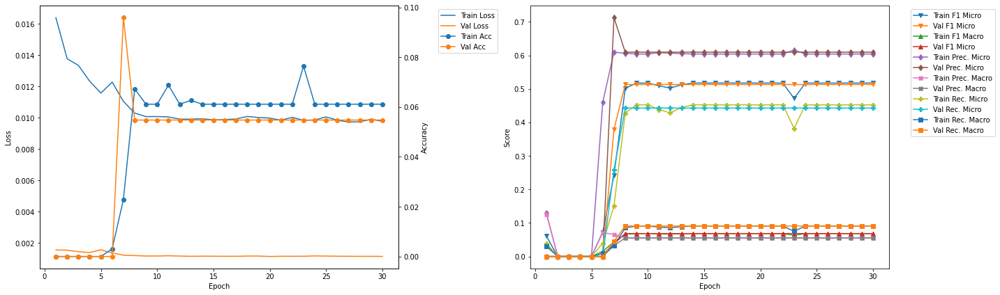

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.03
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0199 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2036 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0459 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4544 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0998 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1312 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0316 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.16
Train Loss: 0.0131 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0

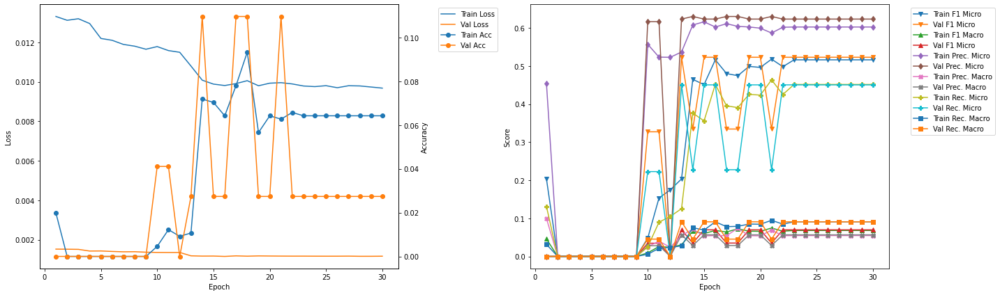

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 7.87
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4958 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.4179 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0839 	Validation Recall Macro: 0.0

Validation F1 Micro Score Increased (0.522989 --> 0.530120).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.0
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4626 	Validation F1 Micro: 0.5301
Train F1 Marco: 0.0628 	Validation F1 Macro: 0.0681
Train Precision Mirco: 0.6163 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0549 	Valid

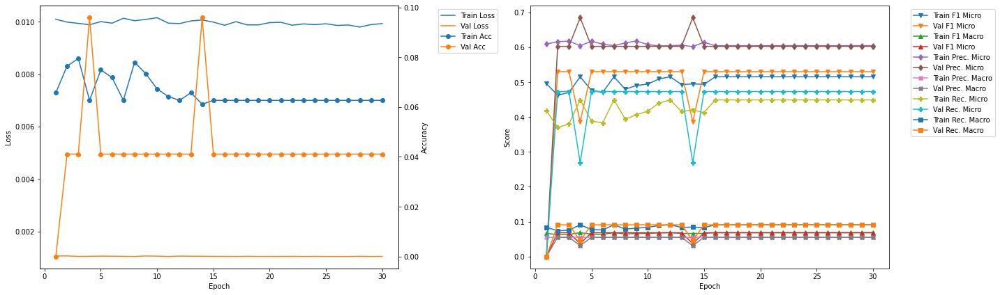

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.7
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5013 	Validation F1 Micro: 0.337
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0286
Train Recall Mirco: 0.427 	Validation Recall Micro: 0.23
Train Recall Marco: 0.0853 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.82
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4574 	Validation F1 Micro: 0.5202
Train F1 Marco: 0.0612 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.625 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.055 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3606 	Validat

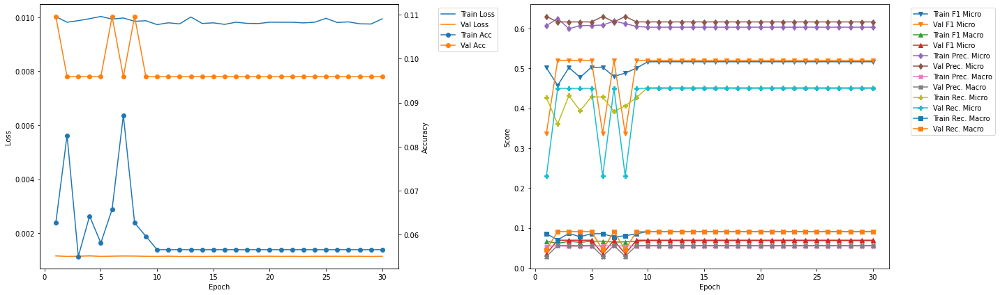

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.530120 --> 0.550725).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 15.52
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.137
Train F1 Mirco: 0.464 	Validation F1 Micro: 0.5507
Train F1 Marco: 0.0624 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.6153 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.3724 	Validation Recall Micro: 0.4774
Train Recall Marco: 0.0736 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.65
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.052 	Validation Accuracy: 0.137
Train F1 Mirco: 0.5131 	Validation F1 Micro: 0.5507
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.5994 	Validation Precision Micro: 0.6507
Train Precision Ma

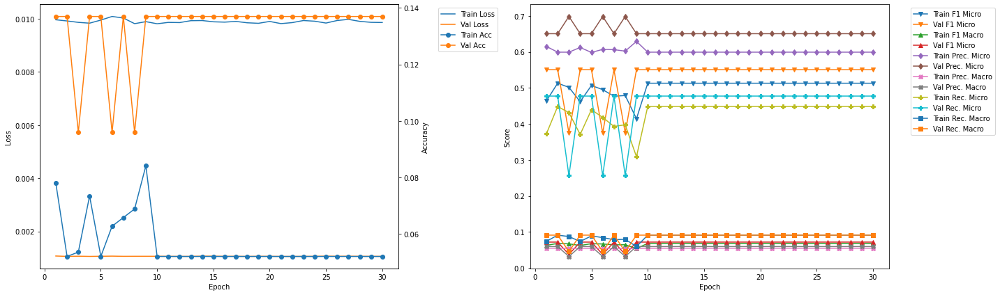

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.35
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4739 	Validation F1 Micro: 0.4713
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0632
Train Precision Mirco: 0.6137 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0694 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.3859 	Validation Recall Micro: 0.4216
Train Recall Marco: 0.0763 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.47
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5218 	Validation F1 Micro: 0.4713
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0632
Train Precision Mirco: 0.6124 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4546 	

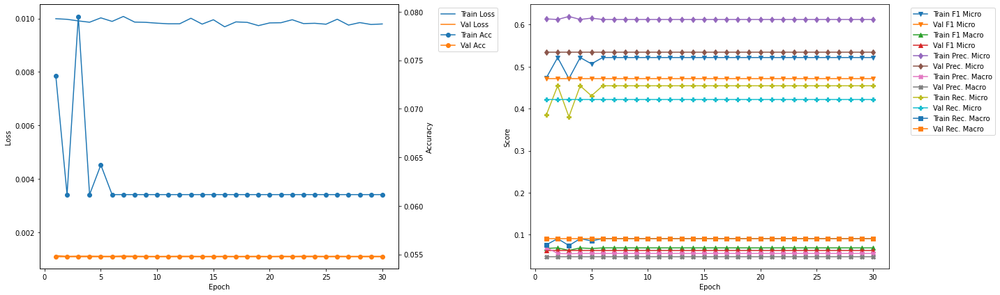

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.17
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0856 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.499 	Validation F1 Micro: 0.5029
Train F1 Marco: 0.0668 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6188 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0558 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.418 	Validation Recall Micro: 0.4388
Train Recall Marco: 0.0832 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.3
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5185 	Validation F1 Micro: 0.5029
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4529 	Val

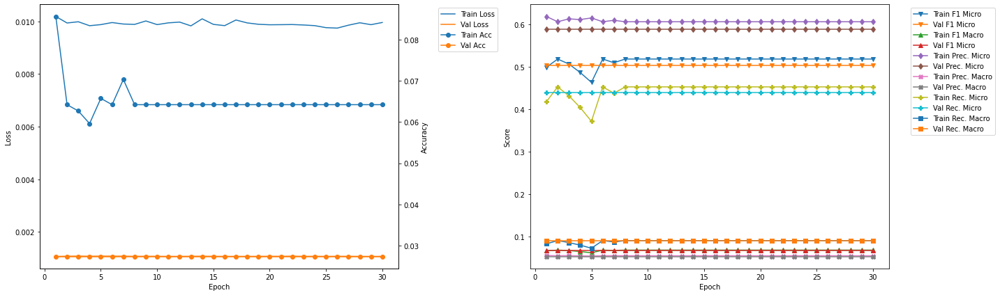

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 27.0
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.5191 	Validation F1 Micro: 0.497
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0668
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4535 	Validation Recall Micro: 0.433
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 27.13
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4987 	Validation F1 Micro: 0.4056
Train F1 Marco: 0.0697 	Validation F1 Macro: 0.0601
Train Precision Mirco: 0.6091 	Validation Precision Micro: 0.6304
Train Precision Marco: 0.0759 	Validation Precision Macro: 0.0836
Train Recall Mirco: 0.4221 	Va

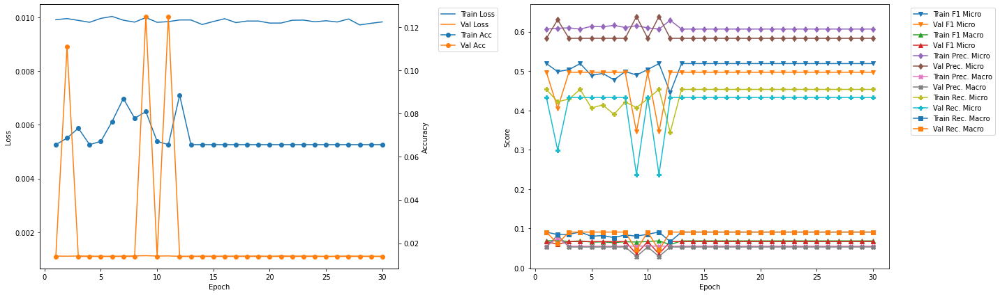

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.82
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.489 	Validation F1 Micro: 0.5215
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6102 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4079 	Validation Recall Micro: 0.467
Train Recall Marco: 0.0815 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.95
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5164 	Validation F1 Micro: 0.5215
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4499 	Vali

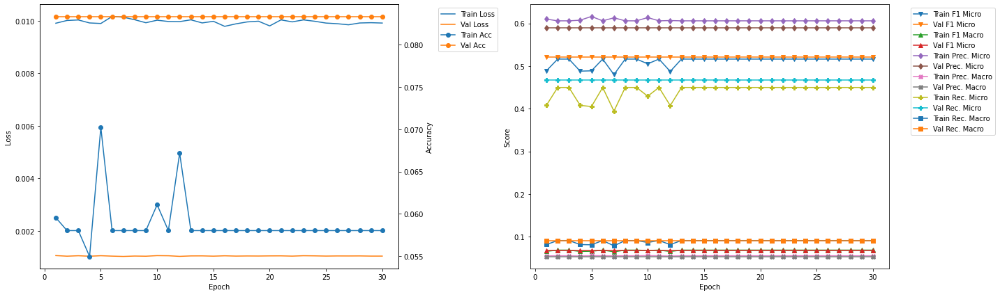

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.65
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0794 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4854 	Validation F1 Micro: 0.5376
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6159 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4006 	Validation Recall Micro: 0.4604
Train Recall Marco: 0.0797 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.77
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4629 	Validation F1 Micro: 0.5376
Train F1 Marco: 0.062 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6037 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0535 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.37

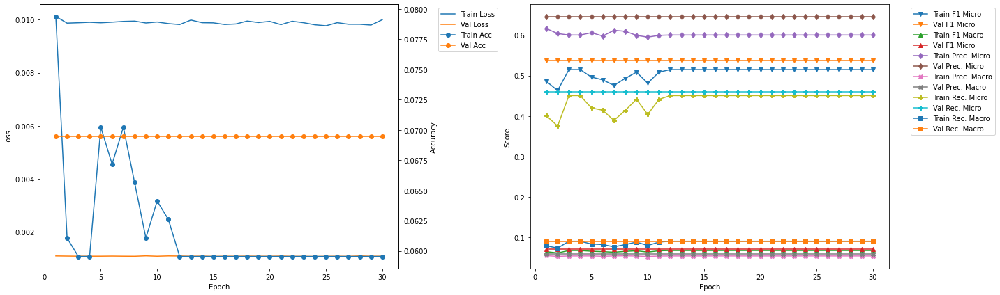

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 5 	Epoch: 1
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.137
Train F1 Mirco: 0.464 	Validation F1 Micro: 0.5507
Train F1 Marco: 0.0624 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.6153 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.3724 	Validation Recall Micro: 0.4774
Train Recall Marco: 0.0736 	Validation Recall Macro: 0.0909


In [20]:
resnet18LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = resnet18LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.18
Train Loss: 0.0165 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0689 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0494 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.146 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1445 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0451 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0377 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.35
Train Loss: 0.0126 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

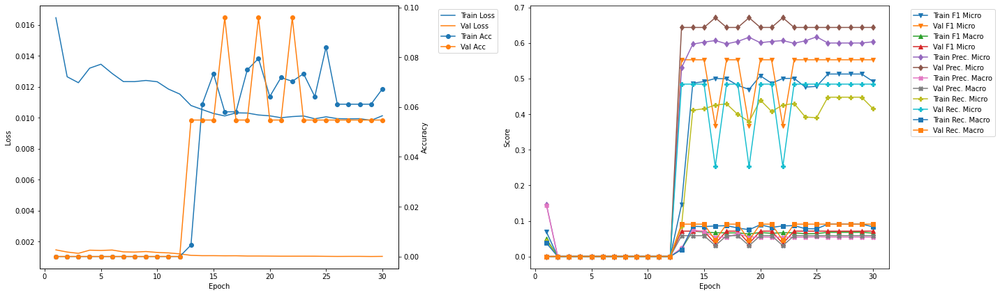

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.43
Train Loss: 0.015 	Validation Loss: 0.0015
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0626 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0282 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1745 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0971 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0381 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0194 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.6
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	

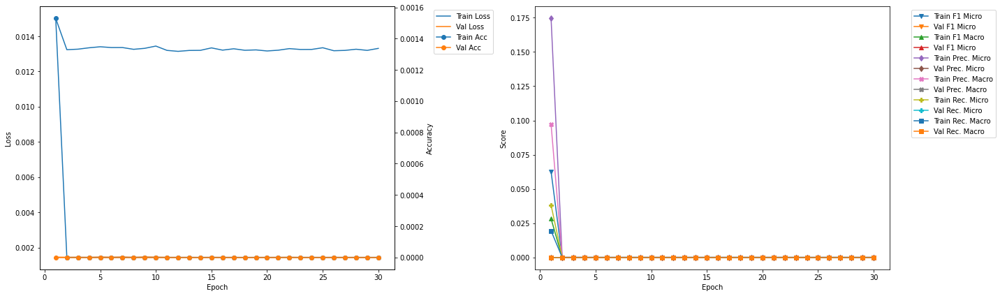

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.68
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.86
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

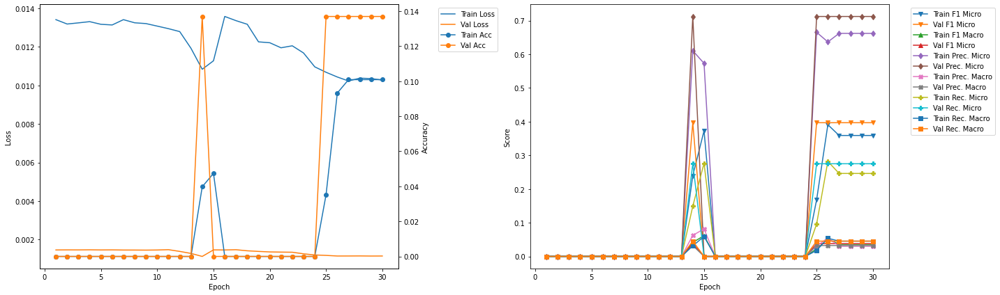

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.93
Train Loss: 0.014 	Validation Loss: 0.0014
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0397 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0077 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.37 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0345 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.021 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0044 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 16.11
Train Loss: 0.0128 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	

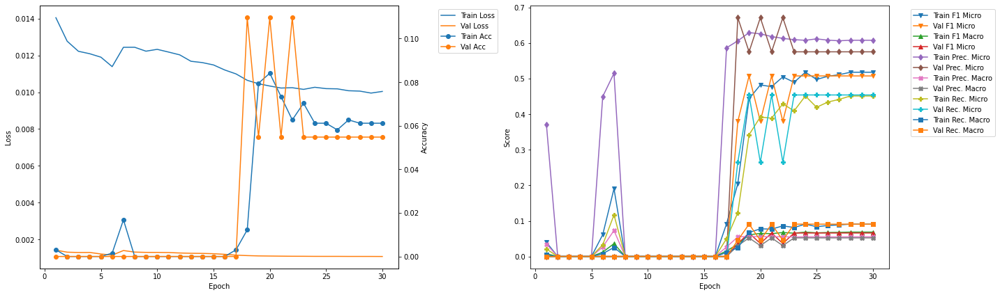

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.18
Train Loss: 0.0108 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4009 	Validation F1 Micro: 0.4912
Train F1 Marco: 0.0594 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6096 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0716 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.2987 	Validation Recall Micro: 0.4286
Train Recall Marco: 0.0595 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.36
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4834 	Validation F1 Micro: 0.4912
Train F1 Marco: 0.0645 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6152 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.3981

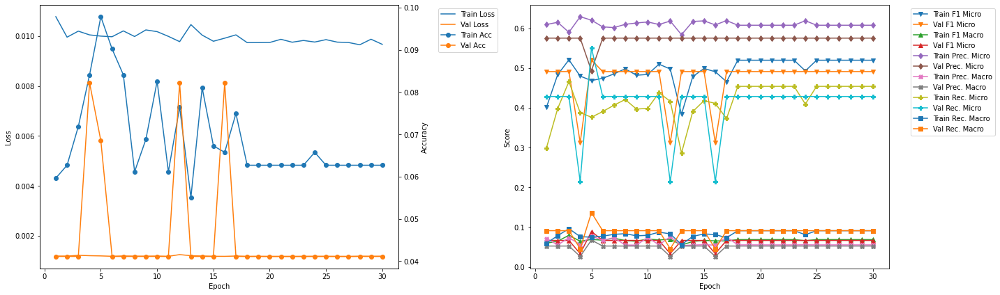

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.43
Train Loss: 0.0104 	Validation Loss: 0.001
Train Accuracy: 0.0596 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4652 	Validation F1 Micro: 0.3849
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0374
Train Precision Mirco: 0.6024 	Validation Precision Micro: 0.6986
Train Precision Marco: 0.0728 	Validation Precision Macro: 0.0318
Train Recall Mirco: 0.3789 	Validation Recall Micro: 0.2656
Train Recall Marco: 0.0768 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.552941 --> 0.556213).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.61
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4636 	Validation F1 Micro: 0.5562
Train F1 Marco: 0.0625 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6163 	Validation Precision Micro: 0.6438
Train Precis

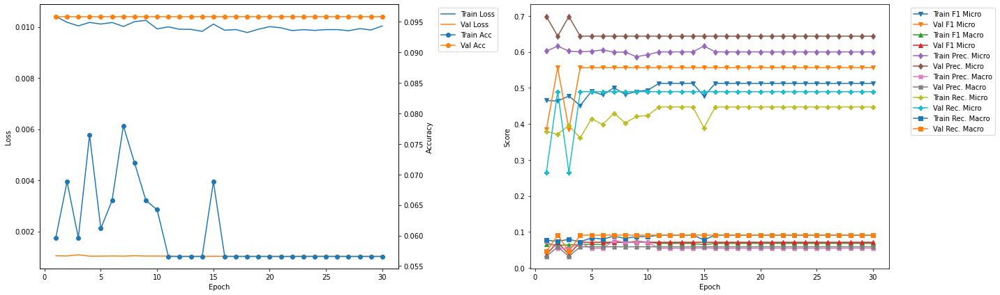

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.69
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4599 	Validation F1 Micro: 0.5476
Train F1 Marco: 0.0705 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.5714 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0676 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3847 	Validation Recall Micro: 0.4842
Train Recall Marco: 0.0789 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.86
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5135 	Validation F1 Micro: 0.5476
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.6017 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4479 	

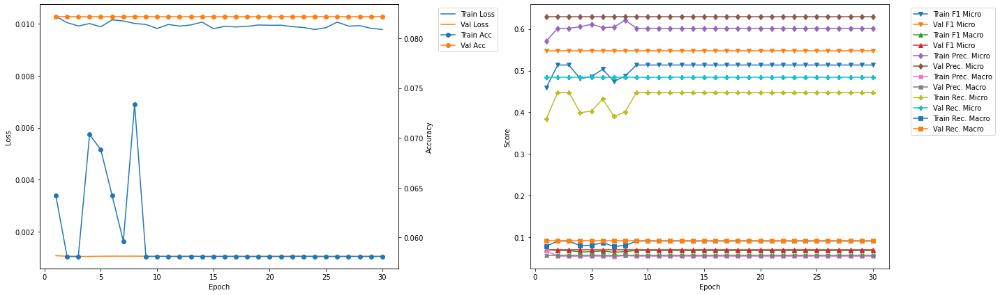

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.93
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.483 	Validation F1 Micro: 0.5294
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6141 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.3981 	Validation Recall Micro: 0.4592
Train Recall Marco: 0.079 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.1
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5155 	Validation F1 Micro: 0.5294
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4506 	V

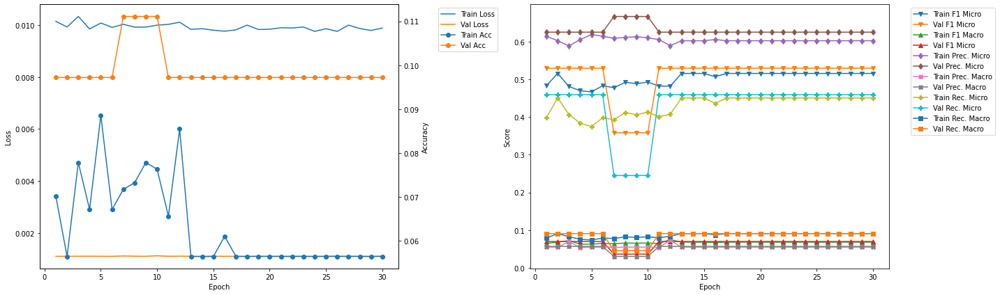

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.18
Train Loss: 0.0099 	Validation Loss: 0.0013
Train Accuracy: 0.0855 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4637 	Validation F1 Micro: 0.4916
Train F1 Marco: 0.0701 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.5955 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0719 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3797 	Validation Recall Micro: 0.4112
Train Recall Marco: 0.0761 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.35
Train Loss: 0.0098 	Validation Loss: 0.0013
Train Accuracy: 0.0733 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5119 	Validation F1 Micro: 0.4916
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6079 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.44

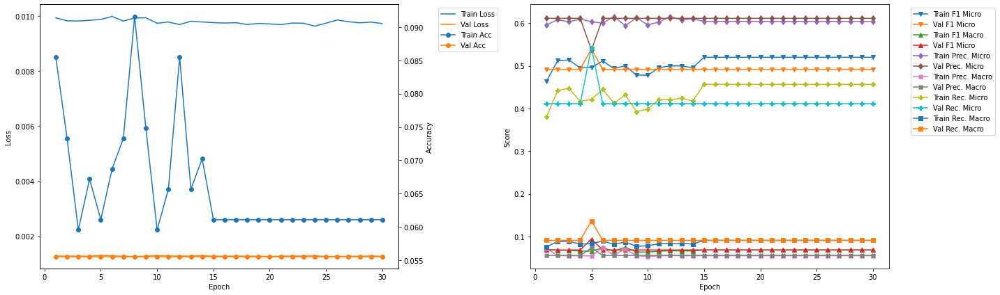

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 47.42
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0947 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4797 	Validation F1 Micro: 0.5043
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6258 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.3889 	Validation Recall Micro: 0.4328
Train Recall Marco: 0.0761 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 47.6
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0962 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4646 	Validation F1 Micro: 0.5043
Train F1 Marco: 0.062 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6242 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.37 	Va

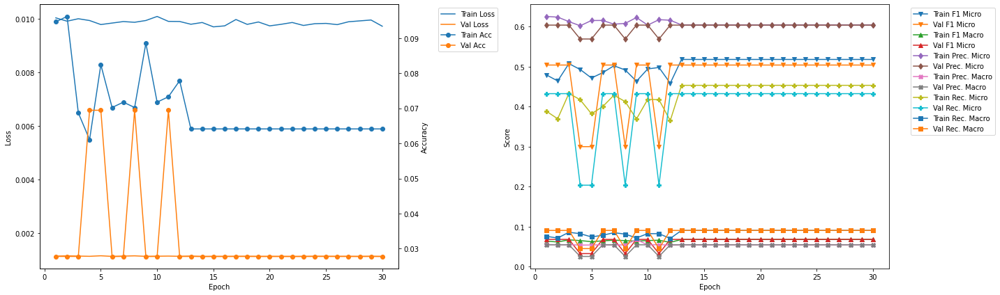

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 6 	Epoch: 2
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4636 	Validation F1 Micro: 0.5562
Train F1 Marco: 0.0625 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6163 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.3715 	Validation Recall Micro: 0.4896
Train Recall Marco: 0.0737 	Validation Recall Macro: 0.0909


In [21]:
resnet50LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = resnet50LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.22
Train Loss: 0.0277 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.107 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0746 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1272 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1188 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0924 	Validation Recall Micro: 0.0
Train Recall Marco: 0.1159 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.44
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

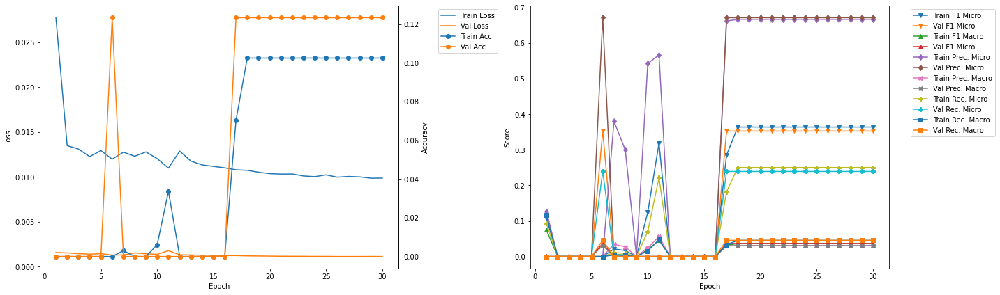

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.83
Train Loss: 0.0126 	Validation Loss: 0.0015
Train Accuracy: 0.0046 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0222 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0091 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3333 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0396 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0115 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0077 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.05
Train Loss: 0.0118 	Validation Loss: 0.0016
Train Accuracy: 0.0183 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1366 	Validation F1 Micro: 0.0071
Train F1 Marco: 0.0238 	Validation F1 Macro: 0.0012
Train Precision Mirco: 0.4338 	Validation Precision Micro: 0.0137
Train Precision Marco: 0.0342 	Validation Precision Macro: 0.0006
Train Recall Mirco: 0.081 	Validation Recall Micro

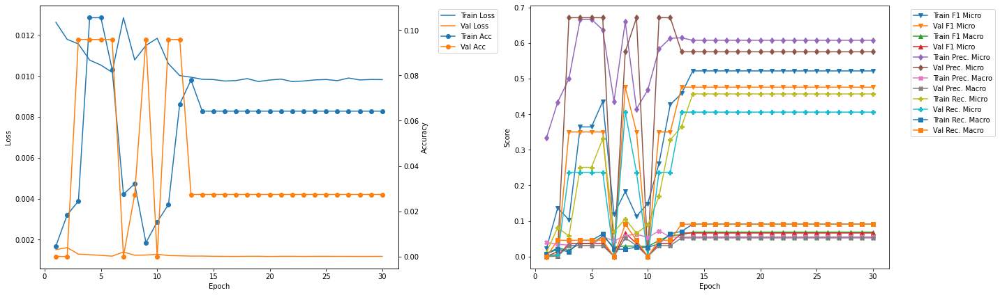

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 13.44
Train Loss: 0.0139 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0339 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0092 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2319 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0649 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0183 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0063 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.66
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0061 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.1025 	Validation F1 Micro: 0.306
Train F1 Marco: 0.0169 	Validation F1 Macro: 0.0327
Train Precision Mirco: 0.5531 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0251 	Validation Precision Macro: 0.0255
Train Recall Mirco: 0.0565 	Validation Recall Mic

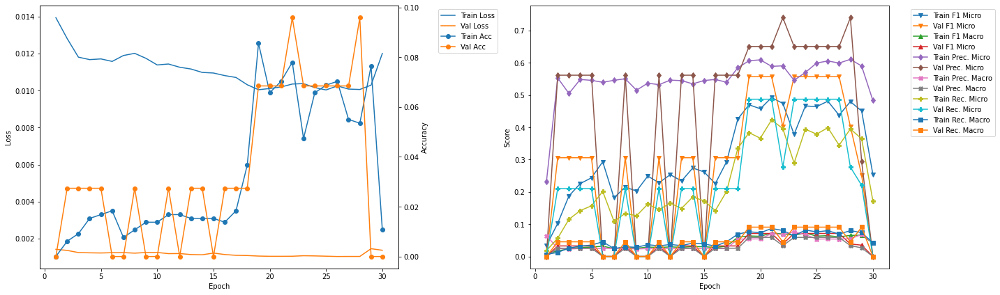

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 20.06
Train Loss: 0.0114 	Validation Loss: 0.0012
Train Accuracy: 0.0183 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2286 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0344 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5245 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0474 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1462 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0341 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 20.28
Train Loss: 0.0107 	Validation Loss: 0.0012
Train Accuracy: 0.0275 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.3192 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0525 	Validation F1 Macro: 0.0663
Train Precision Mirco: 0.5729 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0717 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.2213 	Validation Recall

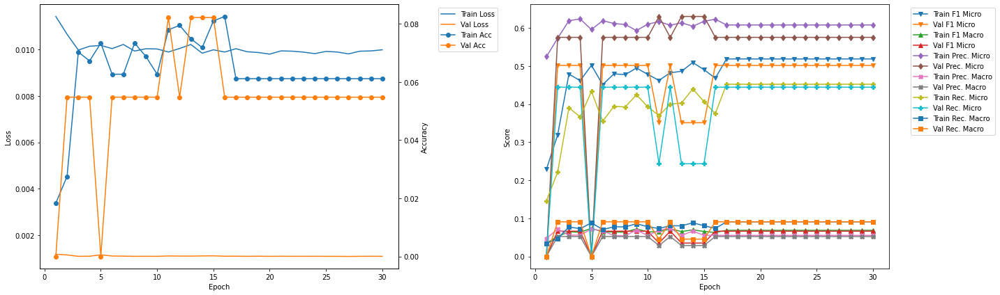

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.66
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4411 	Validation F1 Micro: 0.3816
Train F1 Marco: 0.0631 	Validation F1 Macro: 0.0387
Train Precision Mirco: 0.5928 	Validation Precision Micro: 0.7397
Train Precision Marco: 0.0656 	Validation Precision Macro: 0.0336
Train Recall Mirco: 0.3512 	Validation Recall Micro: 0.2571
Train Recall Marco: 0.0707 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.88
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4695 	Validation F1 Micro: 0.5112
Train F1 Marco: 0.0629 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6126 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.38

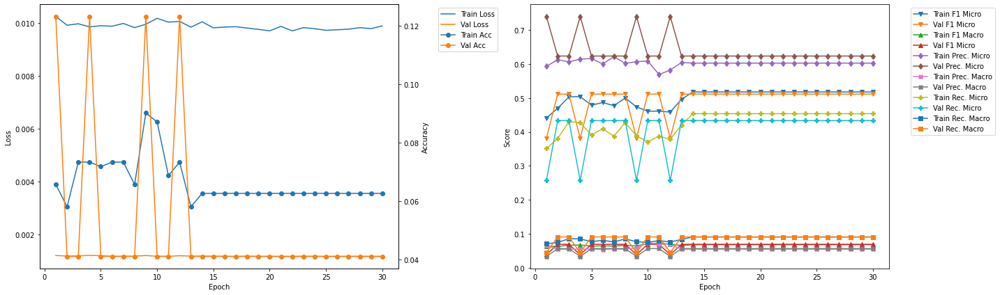

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.26
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4362 	Validation F1 Micro: 0.5103
Train F1 Marco: 0.0605 	Validation F1 Macro: 0.0679
Train Precision Mirco: 0.6169 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.3373 	Validation Recall Micro: 0.4462
Train Recall Marco: 0.0669 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.48
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4534 	Validation F1 Micro: 0.5103
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0679
Train Precision Mirco: 0.6021 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0712 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.363

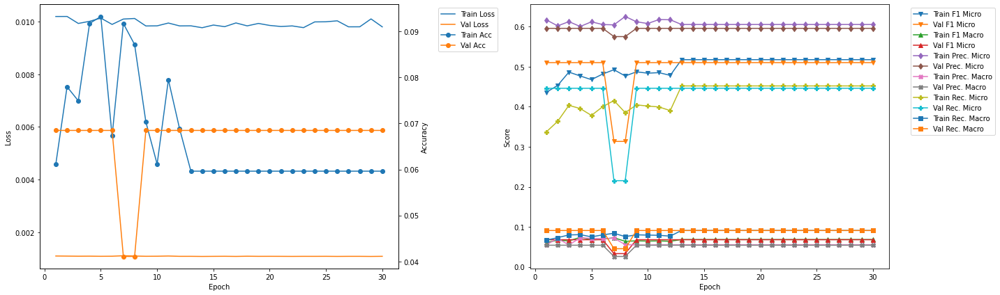

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.87
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4789 	Validation F1 Micro: 0.5238
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.068
Train Precision Mirco: 0.6191 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0777 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3904 	Validation Recall Micro: 0.4632
Train Recall Marco: 0.0786 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.09
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4768 	Validation F1 Micro: 0.5238
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.068
Train Precision Mirco: 0.6164 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3887 	Va

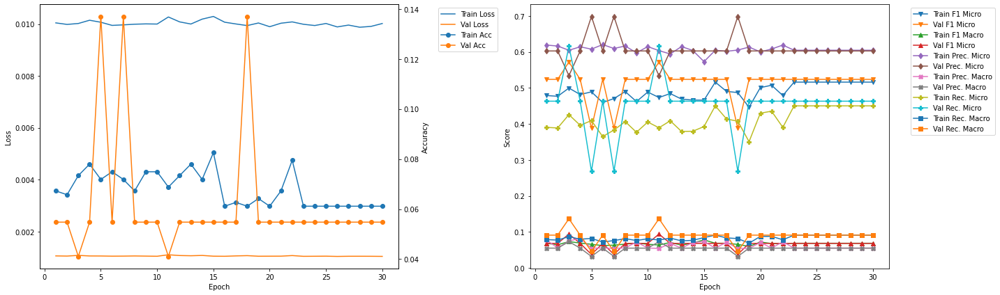

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 46.47
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0916 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4729 	Validation F1 Micro: 0.5163
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6118 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0661 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.3854 	Validation Recall Micro: 0.4508
Train Recall Marco: 0.0763 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 46.69
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4952 	Validation F1 Micro: 0.3547
Train F1 Marco: 0.0744 	Validation F1 Macro: 0.0359
Train Precision Mirco: 0.5936 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.071 	Validation Precision Macro: 0.0297
Train Recall Mirco: 0.4247 

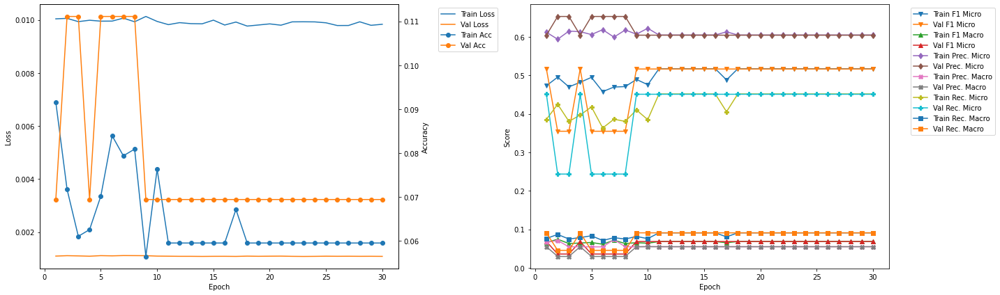

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 53.06
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0718 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.498 	Validation F1 Micro: 0.3347
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.033
Train Precision Mirco: 0.6081 	Validation Precision Micro: 0.5694
Train Precision Marco: 0.0733 	Validation Precision Macro: 0.0259
Train Recall Mirco: 0.4216 	Validation Recall Micro: 0.237
Train Recall Marco: 0.0854 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 53.29
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4666 	Validation F1 Micro: 0.5363
Train F1 Marco: 0.0627 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6147 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.376 	V

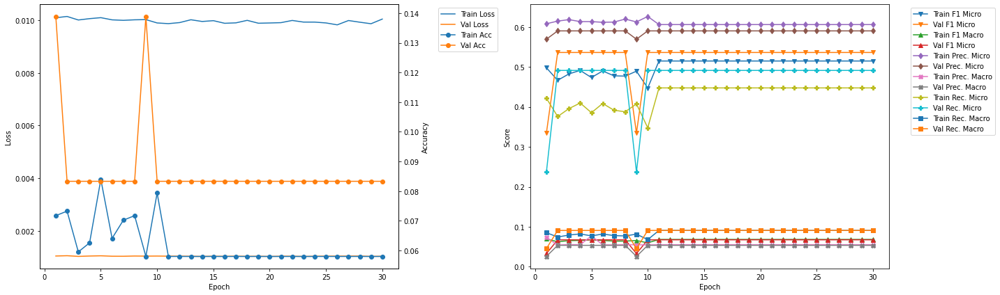

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 59.66
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0824 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4765 	Validation F1 Micro: 0.515
Train F1 Marco: 0.0705 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.5991 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0708 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.3956 	Validation Recall Micro: 0.4526
Train Recall Marco: 0.0799 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 59.88
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0809 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4744 	Validation F1 Micro: 0.515
Train F1 Marco: 0.075 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6126 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0774 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.387 	V

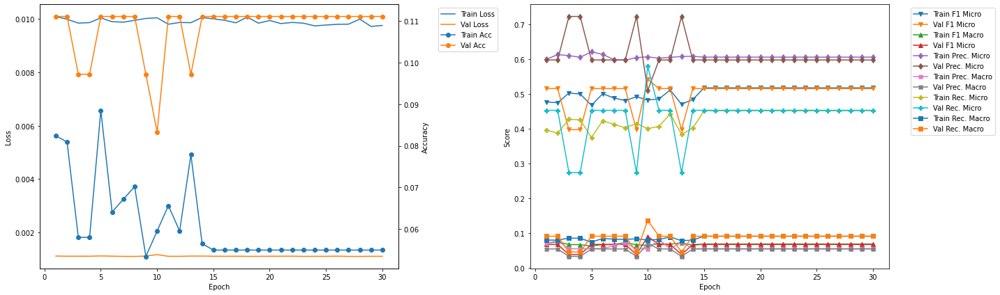

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 7 	Epoch: 3
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4997 	Validation F1 Micro: 0.5721
Train F1 Marco: 0.073 	Validation F1 Macro: 0.0938
Train Precision Mirco: 0.6047 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0745 	Validation Precision Macro: 0.0729
Train Recall Mirco: 0.4257 	Validation Recall Micro: 0.6158
Train Recall Marco: 0.0867 	Validation Recall Macro: 0.1364


In [22]:
resnet101LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = resnet101LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.18
Train Loss: 0.0245 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0521 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0357 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0989 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1107 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0354 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0268 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.35
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

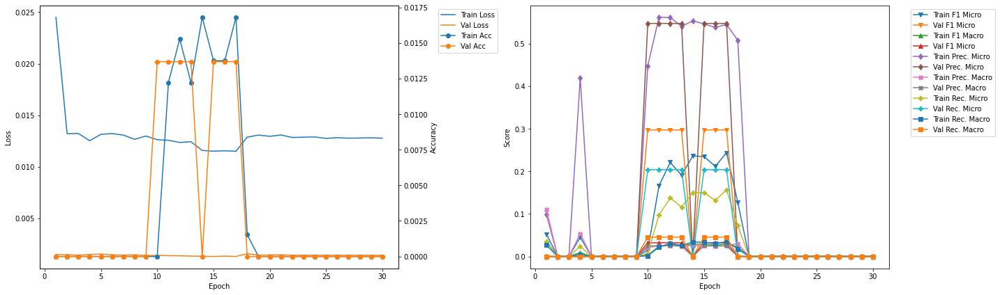

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.49
Train Loss: 0.0138 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0157 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0046 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.56 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0255 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.008 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0025 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.66
Train Loss: 0.013 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Valid

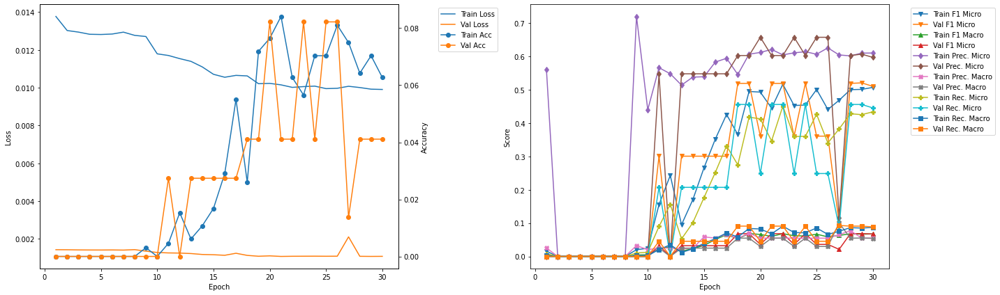

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.520710 --> 0.551929).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 10.8
Train Loss: 0.0106 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4156 	Validation F1 Micro: 0.5519
Train F1 Marco: 0.0619 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.5887 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0673 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3212 	Validation Recall Micro: 0.4869
Train Recall Marco: 0.0647 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.98
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0826 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4583 	Validation F1 Micro: 0.5519
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.637
Train Precision

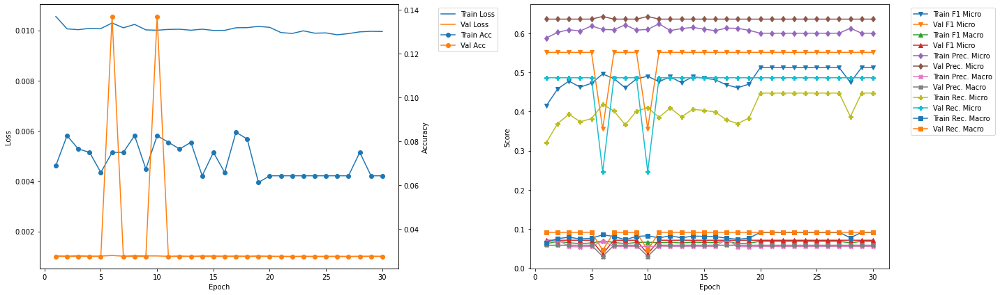

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 16.12
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4629 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0728 	Validation F1 Macro: 0.065
Train Precision Mirco: 0.5922 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0744 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.38 	Validation Recall Micro: 0.453
Train Recall Marco: 0.0785 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 16.29
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4917 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.065
Train Precision Mirco: 0.6128 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4105 	Val

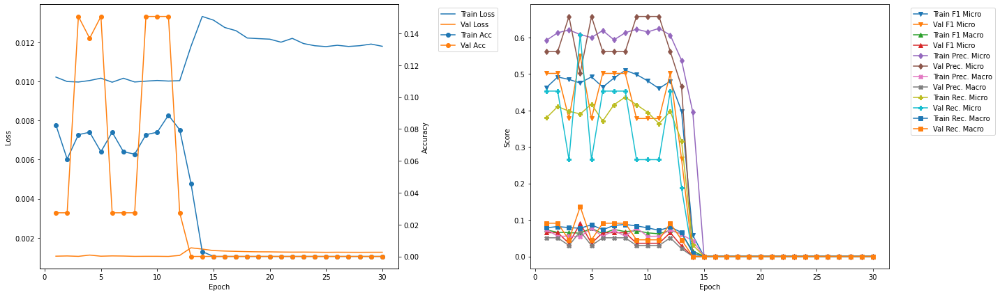

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.43
Train Loss: 0.012 	Validation Loss: 0.0014
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1111 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0175 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.54 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0245 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0619 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0136 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.6
Train Loss: 0.0109 	Validation Loss: 0.0013
Train Accuracy: 0.0138 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.2494 	Validation F1 Micro: 0.3116
Train F1 Marco: 0.0291 	Validation F1 Macro: 0.0337
Train Precision Mirco: 0.539 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0245 	Validation Precision Macro: 0.0268
Train Recall Mirco: 0.1623 	Validation Recall Micro

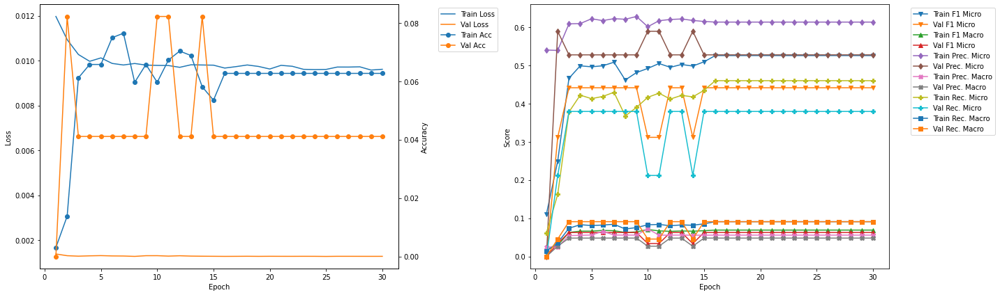

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.74
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4428 	Validation F1 Micro: 0.5519
Train F1 Marco: 0.0607 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.6071 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3485 	Validation Recall Micro: 0.4869
Train Recall Marco: 0.0694 	Validation Recall Macro: 0.0909

Validation F1 Micro Score Increased (0.551929 --> 0.565854).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.92
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4865 	Validation F1 Micro: 0.5659
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0921
Train Precision Mirco: 0.5969 	Validation Precision Micro: 0.5297
Train Preci

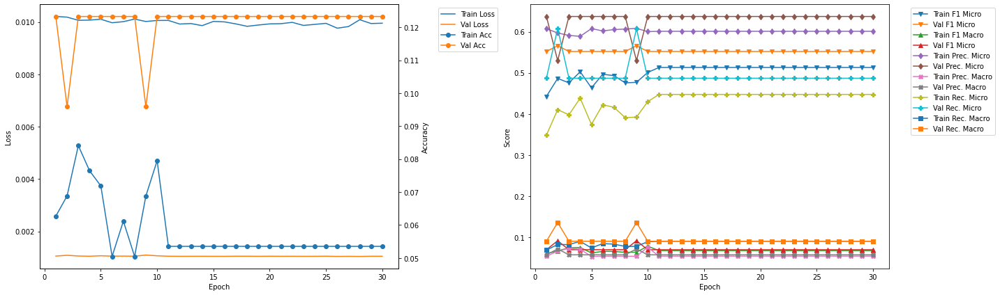

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 32.05
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4681 	Validation F1 Micro: 0.5248
Train F1 Marco: 0.0632 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3789 	Validation Recall Micro: 0.4569
Train Recall Marco: 0.075 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.23
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5053 	Validation F1 Micro: 0.3481
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.4343

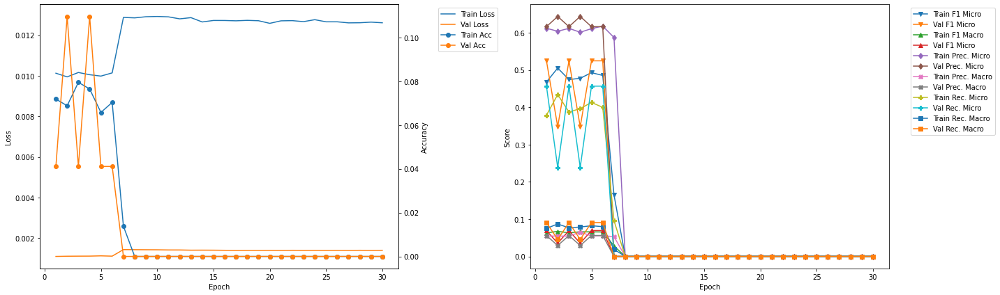

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.36
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.54
Train Loss: 0.0118 	Validation Loss: 0.0014
Train Accuracy: 0.0046 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0853 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0145 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.54 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0245 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0463 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0103

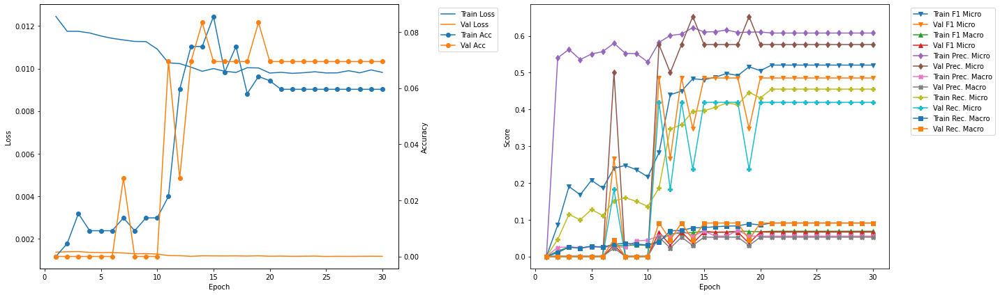

-------------------------------------------
FOLD 9
-------------------------------------------
Validation F1 Micro Score Increased (0.565854 --> 0.567164).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 42.67
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.058 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4527 	Validation F1 Micro: 0.5672
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.5926 	Validation Precision Micro: 0.6597
Train Precision Marco: 0.074 	Validation Precision Macro: 0.06
Train Recall Mirco: 0.3662 	Validation Recall Micro: 0.4974
Train Recall Marco: 0.0749 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.85
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0733 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4992 	Validation F1 Micro: 0.4487
Train F1 Marco: 0.0749 	Validation F1 Macro: 0.0409
Train Precision Mirco: 0.5907 	Validation Precision Micro: 0.8194
Train Precision M

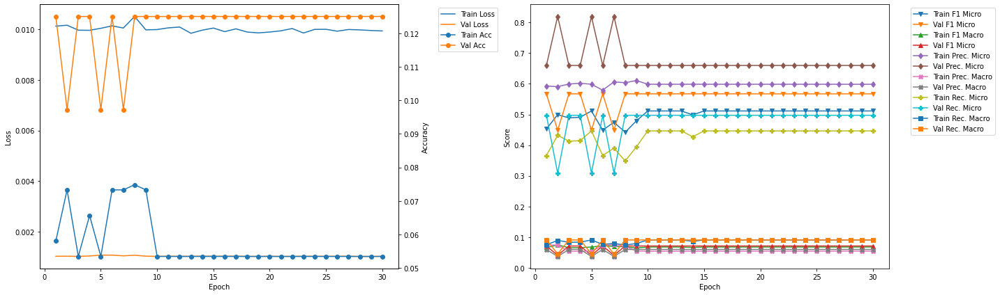

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 47.98
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4293 	Validation F1 Micro: 0.5314
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.5959 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0703 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.3354 	Validation Recall Micro: 0.4515
Train Recall Marco: 0.0677 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 48.15
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0748 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4845 	Validation F1 Micro: 0.5314
Train F1 Marco: 0.0724 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.5838 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0687 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4141 

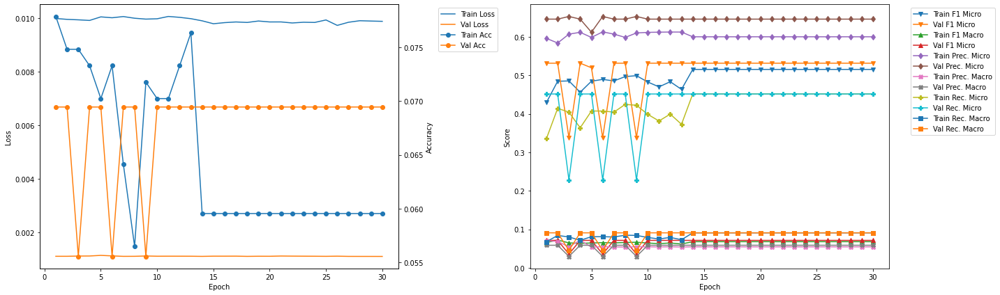

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 9 	Epoch: 1
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.058 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4527 	Validation F1 Micro: 0.5672
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.5926 	Validation Precision Micro: 0.6597
Train Precision Marco: 0.074 	Validation Precision Macro: 0.06
Train Recall Mirco: 0.3662 	Validation Recall Micro: 0.4974
Train Recall Marco: 0.0749 	Validation Recall Macro: 0.0909


In [23]:
densenet121LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = densenet121LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.2
Train Loss: 0.022 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0527 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0444 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1175 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1198 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0339 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0347 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.4
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

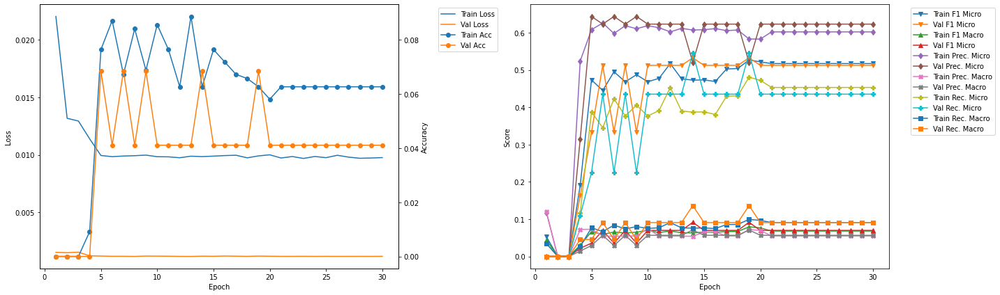

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.23
Train Loss: 0.0124 	Validation Loss: 0.0012
Train Accuracy: 0.0138 	Validation Accuracy: 0.0
Train F1 Mirco: 0.141 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0269 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5053 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0673 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0819 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0174 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.43
Train Loss: 0.0118 	Validation Loss: 0.0015
Train Accuracy: 0.0229 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2593 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0482 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4984 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0748 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1753 	Validation Recall Micro: 0.0
Train 

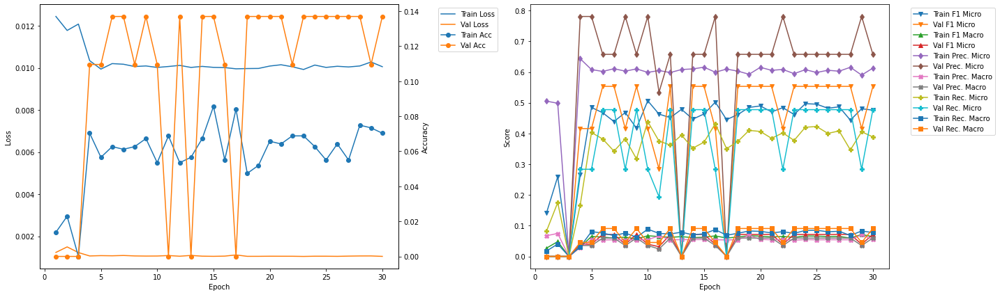

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.25
Train Loss: 0.0123 	Validation Loss: 0.0015
Train Accuracy: 0.0291 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2902 	Validation F1 Micro: 0.0165
Train F1 Marco: 0.0487 	Validation F1 Macro: 0.0034
Train Precision Mirco: 0.5629 	Validation Precision Micro: 0.0588
Train Precision Marco: 0.0695 	Validation Precision Macro: 0.0114
Train Recall Mirco: 0.1955 	Validation Recall Micro: 0.0096
Train Recall Marco: 0.0419 	Validation Recall Macro: 0.002

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.46
Train Loss: 0.0116 	Validation Loss: 0.0012
Train Accuracy: 0.0138 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.1872 	Validation F1 Micro: 0.3203
Train F1 Marco: 0.0291 	Validation F1 Macro: 0.0347
Train Precision Mirco: 0.5142 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.054 	Validation Precision Macro: 0.028
Train Recall Mirco: 0.1144 	Va

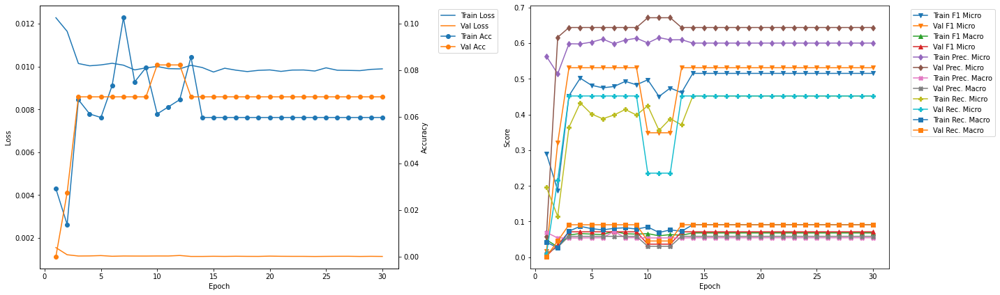

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.28
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.481 	Validation F1 Micro: 0.3137
Train F1 Marco: 0.0694 	Validation F1 Macro: 0.0322
Train Precision Mirco: 0.6165 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.073 	Validation Precision Macro: 0.0249
Train Recall Mirco: 0.3943 	Validation Recall Micro: 0.2198
Train Recall Marco: 0.0783 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.48
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0
Train F1 Mirco: 0.474 	Validation F1 Micro: 0.4634
Train F1 Marco: 0.0635 	Validation F1 Macro: 0.0622
Train Precision Mirco: 0.6323 	Validation Precision Micro: 0.5205
Train Precision Marco: 0.0561 	Validation Precision Macro: 0.0473
Train Recall Mirco: 0.379 	Vali

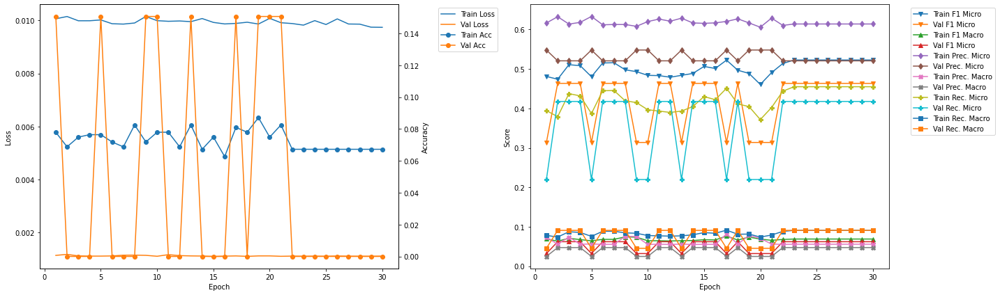

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.3
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4674 	Validation F1 Micro: 0.5428
Train F1 Marco: 0.0631 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.378 	Validation Recall Micro: 0.4767
Train Recall Marco: 0.0752 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.5
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4922 	Validation F1 Micro: 0.5428
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6035 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4156 	V

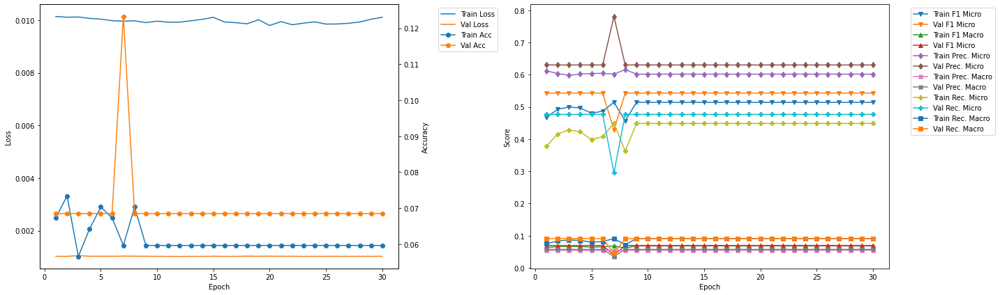

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.33
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4963 	Validation F1 Micro: 0.5073
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.6076 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0697 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4194 	Validation Recall Micro: 0.4416
Train Recall Marco: 0.0839 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.53
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0734 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4759 	Validation F1 Micro: 0.5073
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.5988 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0697 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.3949 	

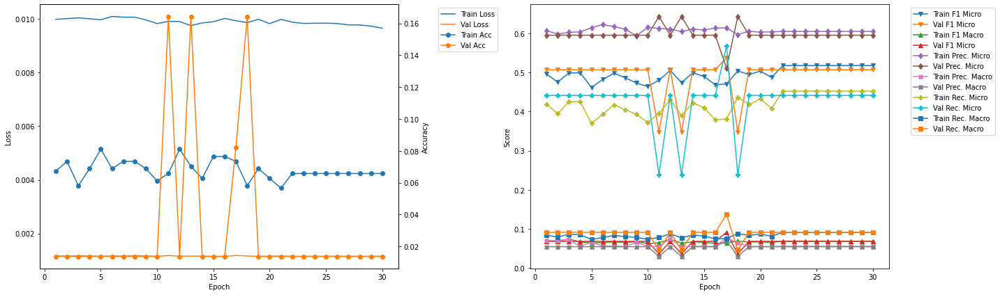

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.35
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4766 	Validation F1 Micro: 0.5254
Train F1 Marco: 0.064 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6094 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3914 	Validation Recall Micro: 0.4656
Train Recall Marco: 0.0777 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.55
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5013 	Validation F1 Micro: 0.5254
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.43 	

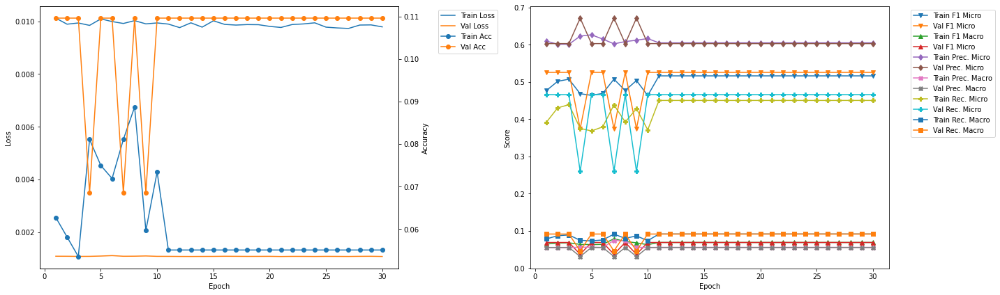

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.37
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0748 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4854 	Validation F1 Micro: 0.5215
Train F1 Marco: 0.0697 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6042 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0697 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4057 	Validation Recall Micro: 0.467
Train Recall Marco: 0.0817 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.57
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4995 	Validation F1 Micro: 0.3543
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.035
Train Precision Mirco: 0.6081 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0284
Train Recall Mirco: 0.4238 	V

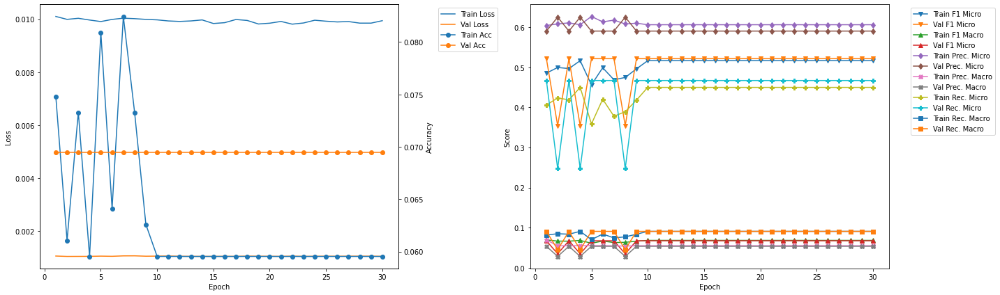

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 48.4
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4904 	Validation F1 Micro: 0.4956
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6147 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4079 	Validation Recall Micro: 0.4271
Train Recall Marco: 0.0806 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 48.6
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4923 	Validation F1 Micro: 0.4956
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.413 	V

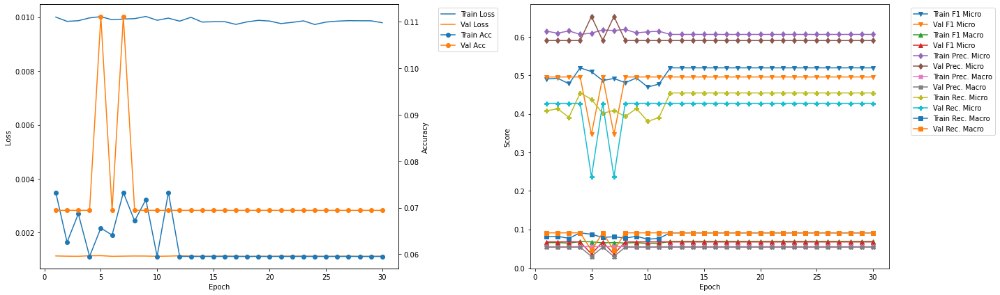

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.42
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4976 	Validation F1 Micro: 0.5136
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6107 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4199 	Validation Recall Micro: 0.4545
Train Recall Marco: 0.0839 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.63
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0748 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4918 	Validation F1 Micro: 0.3629
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0359
Train Precision Mirco: 0.6127 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0297
Train Recall Mirco: 0.41

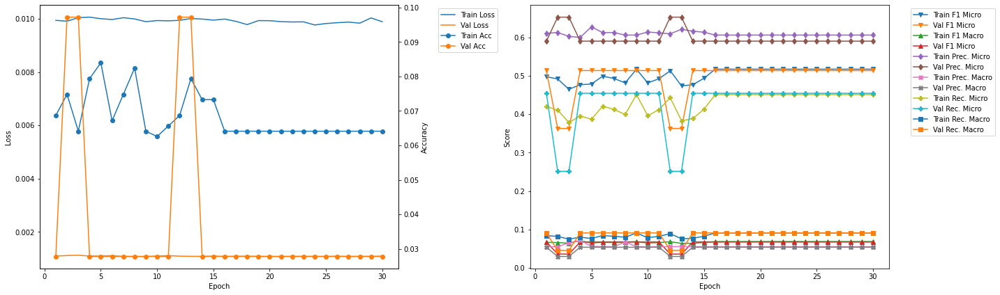

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 6
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.137
Train F1 Mirco: 0.4674 	Validation F1 Micro: 0.5533
Train F1 Marco: 0.0628 	Validation F1 Macro: 0.0715
Train Precision Mirco: 0.602 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0537 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.382 	Validation Recall Micro: 0.4776
Train Recall Marco: 0.0761 	Validation Recall Macro: 0.0909


In [24]:
densenet169LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = densenet169LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet169LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.23
Train Loss: 0.0166 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0482 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0345 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1036 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1002 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0314 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0241 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.45
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

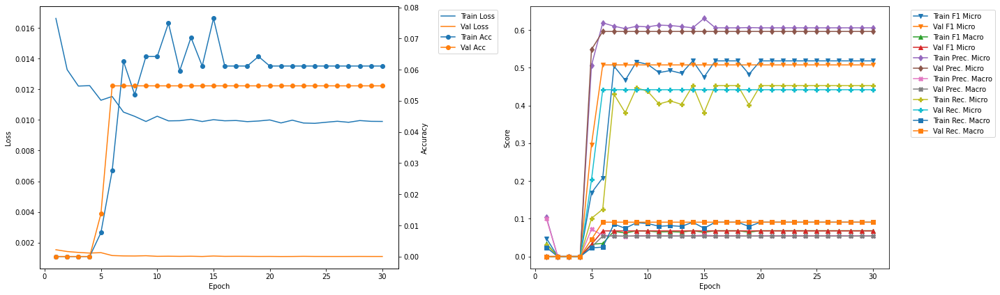

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.507289 --> 0.583090).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 6.98
Train Loss: 0.0105 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4302 	Validation F1 Micro: 0.5831
Train F1 Marco: 0.0715 	Validation F1 Macro: 0.0735
Train Precision Mirco: 0.5617 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.0806 	Validation Precision Macro: 0.0623
Train Recall Mirco: 0.3486 	Validation Recall Micro: 0.5076
Train Recall Marco: 0.0762 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.21
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0566 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4921 	Validation F1 Micro: 0.5831
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0735
Train Precision Mirco: 0.5942 	Validation Precision Micro: 0.6849
Train Precisio

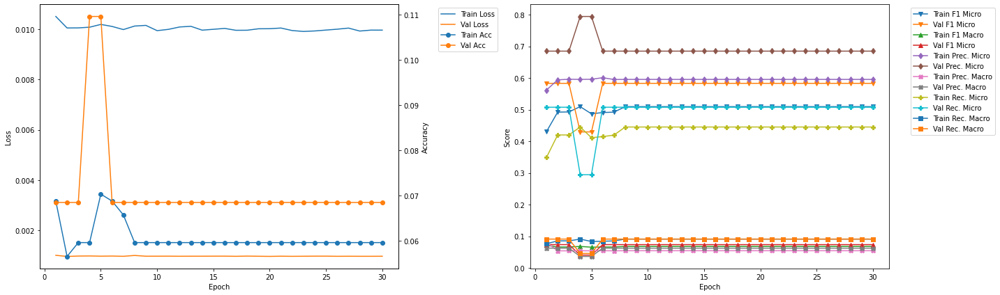

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 13.73
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5111 	Validation F1 Micro: 0.4
Train F1 Marco: 0.0702 	Validation F1 Macro: 0.0378
Train Precision Mirco: 0.5994 	Validation Precision Micro: 0.7123
Train Precision Marco: 0.0677 	Validation Precision Macro: 0.0324
Train Recall Mirco: 0.4455 	Validation Recall Micro: 0.2781
Train Recall Marco: 0.0906 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.95
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4933 	Validation F1 Micro: 0.5405
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.606 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4159 	V

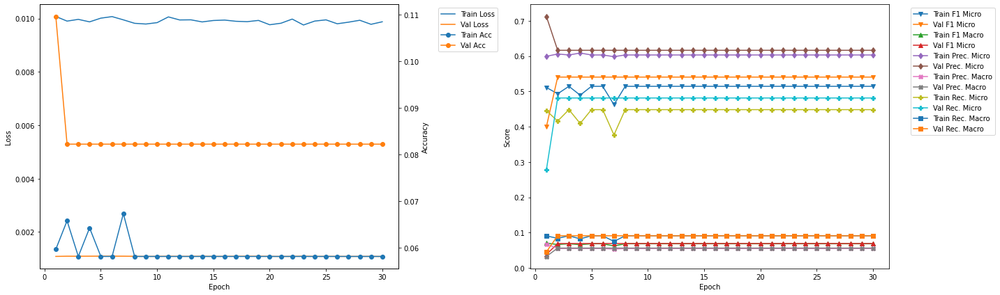

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 20.48
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5194 	Validation F1 Micro: 0.3381
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6066 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.4541 	Validation Recall Micro: 0.2293
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 20.71
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4909 	Validation F1 Micro: 0.5014
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.4122

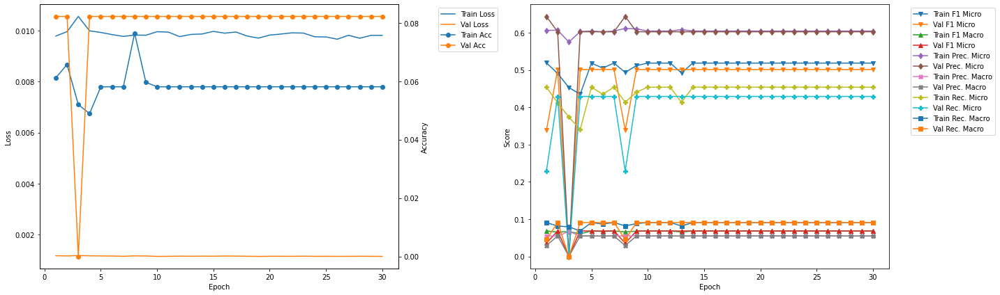

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 27.23
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.515 	Validation F1 Micro: 0.4896
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6103 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4454 	Validation Recall Micro: 0.4339
Train Recall Marco: 0.0891 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 27.45
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5022 	Validation F1 Micro: 0.4896
Train F1 Marco: 0.0668 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6091 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4272

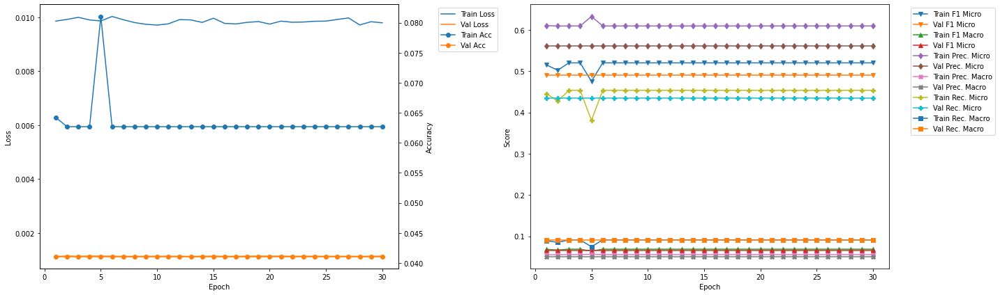

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.98
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5188 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0661
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4525 	Validation Recall Micro: 0.4421
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.2
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5188 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0661
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4525 	Valid

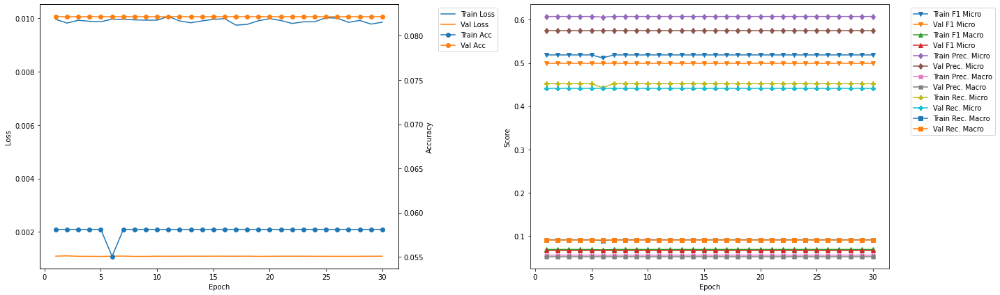

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 40.73
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4995 	Validation F1 Micro: 0.5028
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6084 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4236 	Validation Recall Micro: 0.4245
Train Recall Marco: 0.084 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.96
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5186 	Validation F1 Micro: 0.5028
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4548 

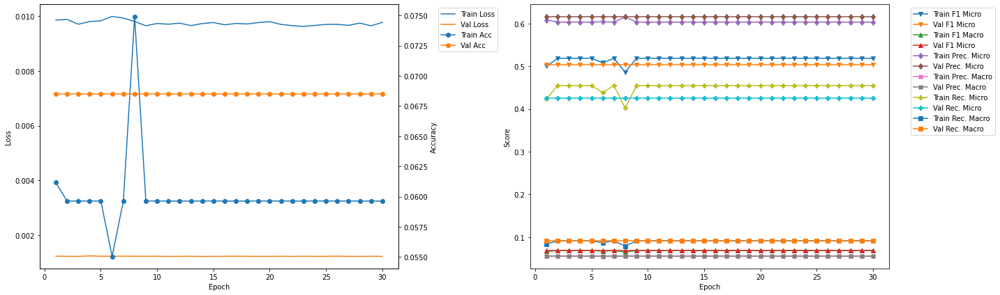

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 47.48
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5133 	Validation F1 Micro: 0.5505
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4473 	Validation Recall Micro: 0.4918
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 47.71
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5133 	Validation F1 Micro: 0.5505
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4473 	Va

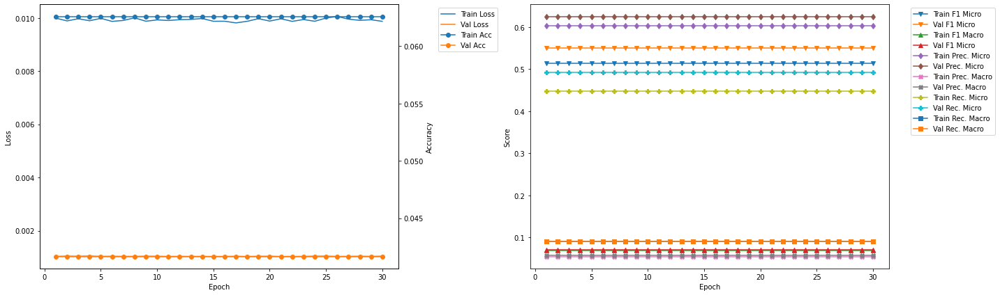

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.24
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0656 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5041 	Validation F1 Micro: 0.5417
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.433 	Validation Recall Micro: 0.474
Train Recall Marco: 0.0873 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.46
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5142 	Validation F1 Micro: 0.5417
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6015 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.449 	V

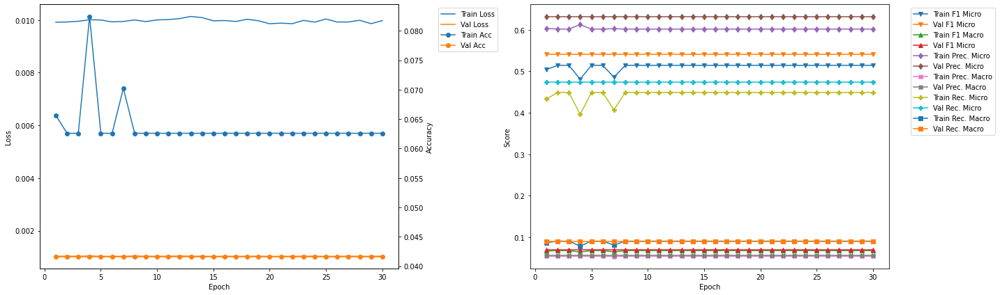

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 61.0
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5238 	Validation F1 Micro: 0.4543
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0633
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.5347
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4578 	Validation Recall Micro: 0.3949
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 61.22
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5238 	Validation F1 Micro: 0.4543
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0633
Train Precision Mirco: 0.6122 	Validation Precision Micro: 0.5347
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.45

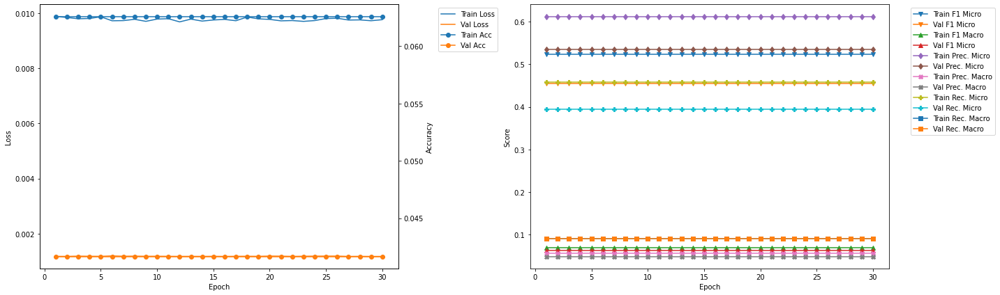

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 1
Train Loss: 0.0105 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4302 	Validation F1 Micro: 0.5831
Train F1 Marco: 0.0715 	Validation F1 Macro: 0.0735
Train Precision Mirco: 0.5617 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.0806 	Validation Precision Macro: 0.0623
Train Recall Mirco: 0.3486 	Validation Recall Micro: 0.5076
Train Recall Marco: 0.0762 	Validation Recall Macro: 0.0909


In [25]:
densenet201LSTM_500_1_0_best = Kfold_train_CNN_RNN(model = densenet201LSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.0165 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0887 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0547 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1333 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0937 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0665 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0496 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.39
Train Loss: 0.0132 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

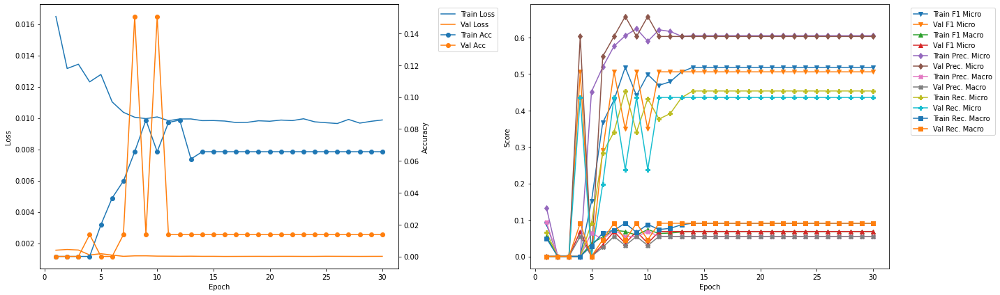

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.98
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5211 	Validation F1 Micro: 0.4802
Train F1 Marco: 0.078 	Validation F1 Macro: 0.0634
Train Precision Mirco: 0.5929 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.073 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4649 	Validation Recall Micro: 0.4317
Train Recall Marco: 0.0955 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.17
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5199 	Validation F1 Micro: 0.4802
Train F1 Marco: 0.0705 	Validation F1 Macro: 0.0634
Train Precision Mirco: 0.6039 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0647 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4563 	Va

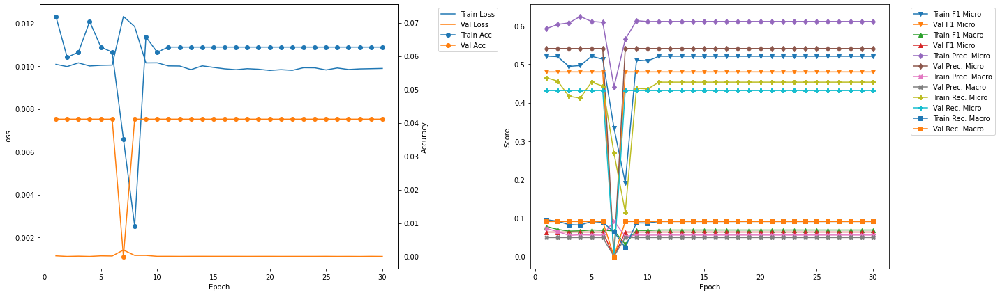

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.505747 --> 0.529231).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 11.76
Train Loss: 0.0106 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.415 	Validation F1 Micro: 0.5292
Train F1 Marco: 0.0631 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.5916 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0597 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3196 	Validation Recall Micro: 0.4804
Train Recall Marco: 0.0673 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.95
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4826 	Validation F1 Micro: 0.5292
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.6097 	Validation Precision Micro: 0.589
Train Precisio

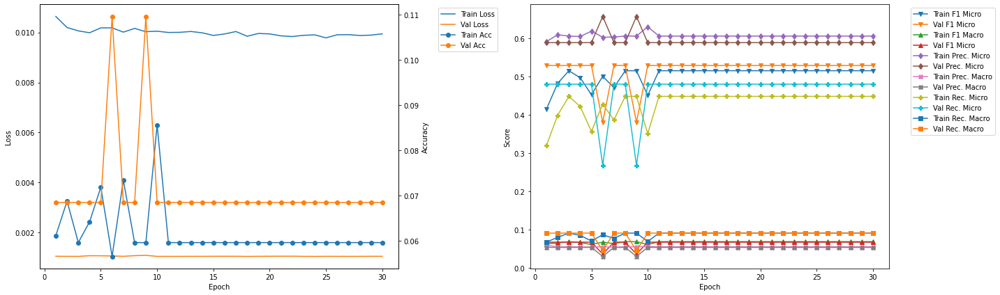

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.529231 --> 0.545994).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 17.54
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0826 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4756 	Validation F1 Micro: 0.546
Train F1 Marco: 0.0708 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.5984 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0695 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3946 	Validation Recall Micro: 0.4817
Train Recall Marco: 0.0807 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.73
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4852 	Validation F1 Micro: 0.4015
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0382
Train Precision Mirco: 0.6118 	Validation Precision Micro: 0.726
Train Precision

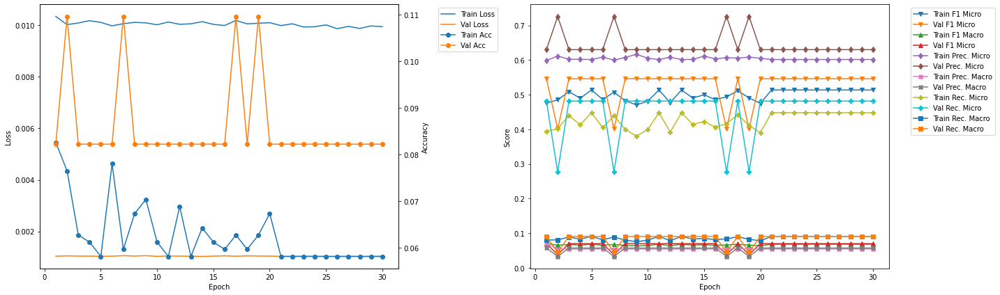

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.545994 --> 0.558559).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 23.33
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4739 	Validation F1 Micro: 0.5586
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.5885 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3966 	Validation Recall Micro: 0.4973
Train Recall Marco: 0.0803 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.52
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0703 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5003 	Validation F1 Micro: 0.5586
Train F1 Marco: 0.0695 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6002 	Validation Precision Micro: 0.637
Train Precision

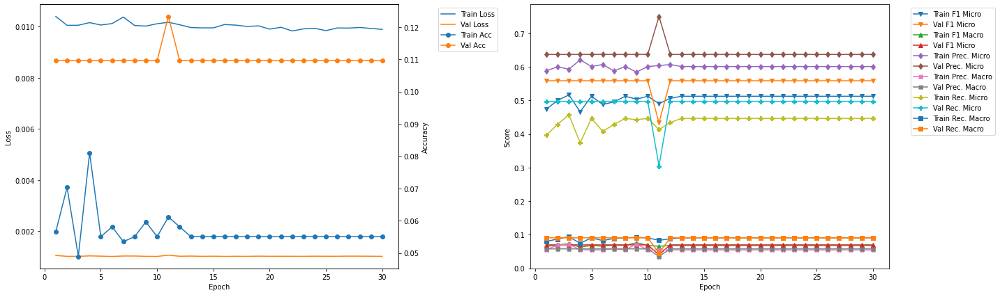

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.09
Train Loss: 0.011 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.3932 	Validation F1 Micro: 0.4928
Train F1 Marco: 0.0617 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.5367 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0583 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3102 	Validation Recall Micro: 0.4236
Train Recall Marco: 0.0708 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.28
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5197 	Validation F1 Micro: 0.4928
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4547 

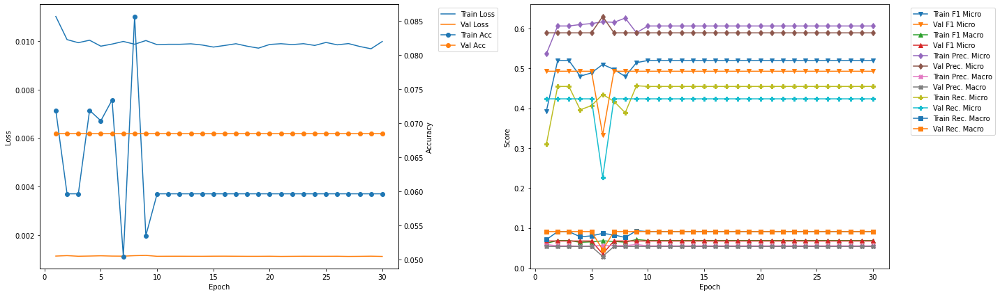

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.85
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0734 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4942 	Validation F1 Micro: 0.5028
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.6095 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4156 	Validation Recall Micro: 0.4245
Train Recall Marco: 0.0822 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 35.05
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4832 	Validation F1 Micro: 0.5028
Train F1 Marco: 0.0643 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4029 	

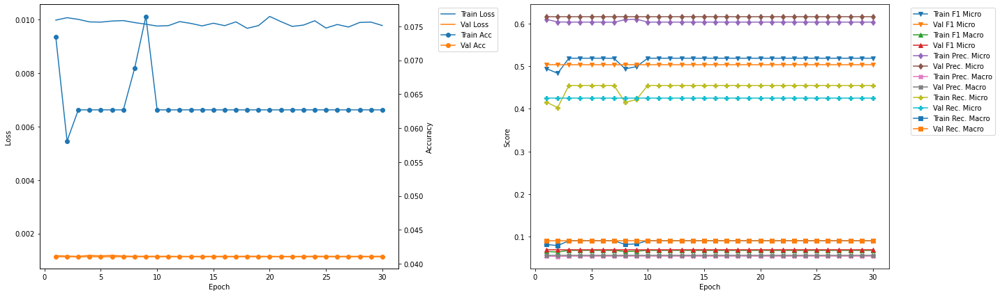

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 40.62
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4947 	Validation F1 Micro: 0.522
Train F1 Marco: 0.0662 	Validation F1 Macro: 0.0694
Train Precision Mirco: 0.6164 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4131 	Validation Recall Micro: 0.4518
Train Recall Marco: 0.0822 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.81
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5017 	Validation F1 Micro: 0.3346
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.035
Train Precision Mirco: 0.6071 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0284
Train Recall Mirco: 0.4274 	V

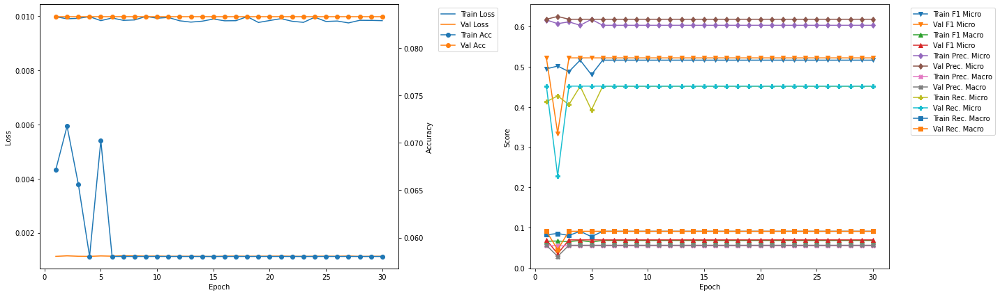

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 46.38
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4939 	Validation F1 Micro: 0.5266
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0694
Train Precision Mirco: 0.6045 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4176 	Validation Recall Micro: 0.4588
Train Recall Marco: 0.0834 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 46.57
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5158 	Validation F1 Micro: 0.5266
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0694
Train Precision Mirco: 0.6031 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.45

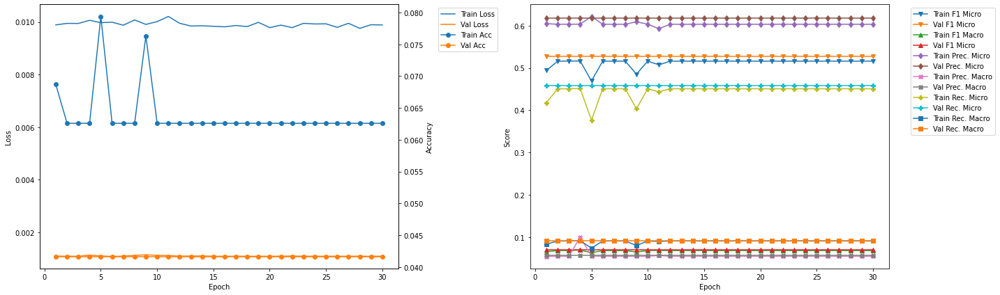

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 52.13
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4935 	Validation F1 Micro: 0.5073
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.6092 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4148 	Validation Recall Micro: 0.4372
Train Recall Marco: 0.0822 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 52.32
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.518 	Validation F1 Micro: 0.5073
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4531 

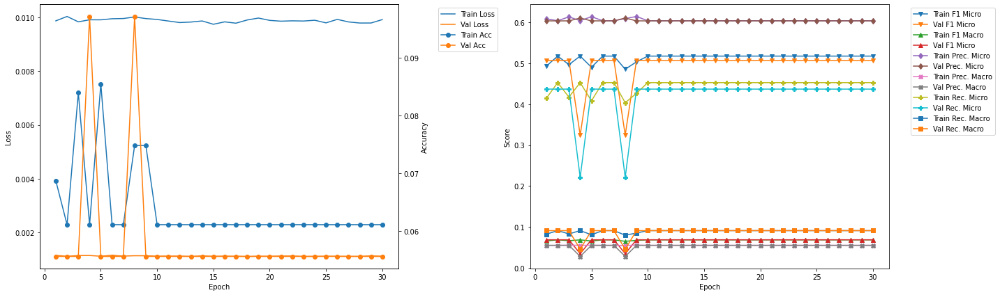

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 5 	Epoch: 1
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4739 	Validation F1 Micro: 0.5586
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.5885 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3966 	Validation Recall Micro: 0.4973
Train Recall Marco: 0.0803 	Validation Recall Macro: 0.0909


In [26]:
vgg11bnLSTM_500_1_0_best = Kfold_train_CNN_RNN(model = vgg11bnLSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.22
Train Loss: 0.0163 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0317 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0302 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0758 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0904 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.02 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0353 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.43
Train Loss: 0.0131 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

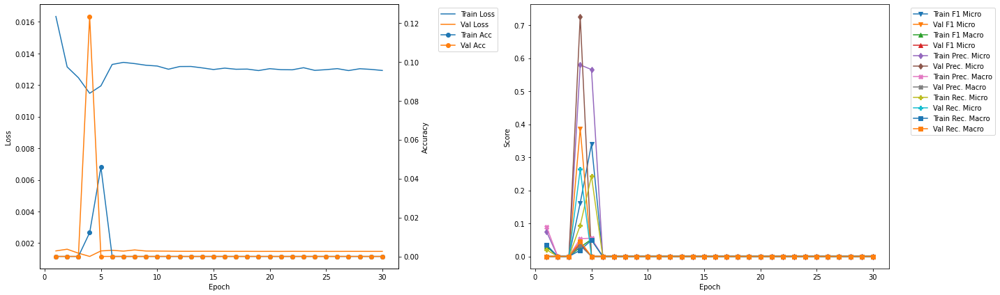

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.57
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.79
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

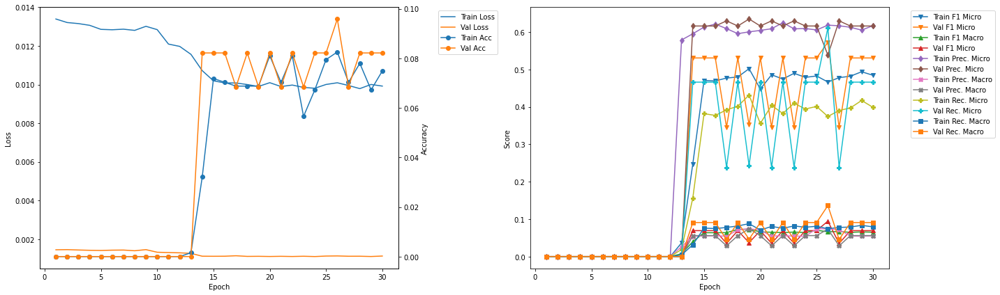

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.97
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4856 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.066
Train Precision Mirco: 0.6109 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0698 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.403 	Validation Recall Micro: 0.4421
Train Recall Marco: 0.0803 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.18
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4733 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.066
Train Precision Mirco: 0.6106 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0747 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.3865 	Valida

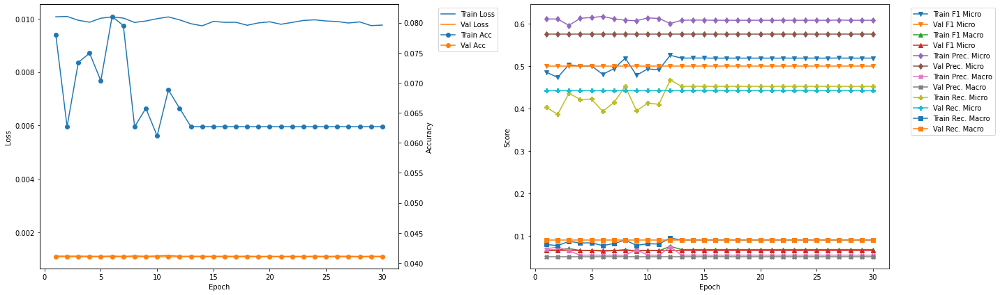

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.572816 --> 0.578588).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 19.36
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4718 	Validation F1 Micro: 0.5786
Train F1 Marco: 0.0628 	Validation F1 Macro: 0.0993
Train Precision Mirco: 0.6045 	Validation Precision Micro: 0.5799
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0791
Train Recall Mirco: 0.3868 	Validation Recall Micro: 0.5773
Train Recall Marco: 0.0758 	Validation Recall Macro: 0.1364

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.58
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.484 	Validation F1 Micro: 0.3549
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0378
Train Precision Mirco: 0.598 	Validation Precision Micro: 0.7123
Train Precisio

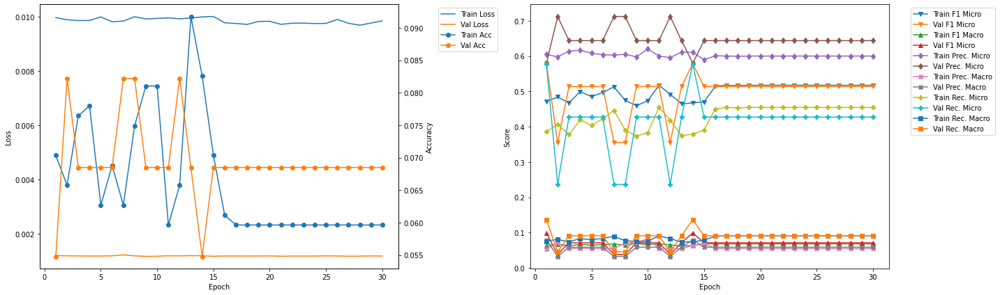

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.73
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5242 	Validation F1 Micro: 0.451
Train F1 Marco: 0.069 	Validation F1 Macro: 0.0613
Train Precision Mirco: 0.6139 	Validation Precision Micro: 0.5205
Train Precision Marco: 0.0558 	Validation Precision Macro: 0.0473
Train Recall Mirco: 0.4573 	Validation Recall Micro: 0.3979
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.94
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5052 	Validation F1 Micro: 0.451
Train F1 Marco: 0.0672 	Validation F1 Macro: 0.0613
Train Precision Mirco: 0.6195 	Validation Precision Micro: 0.5205
Train Precision Marco: 0.0559 	Validation Precision Macro: 0.0473
Train Recall Mirco: 0.4265 	Val

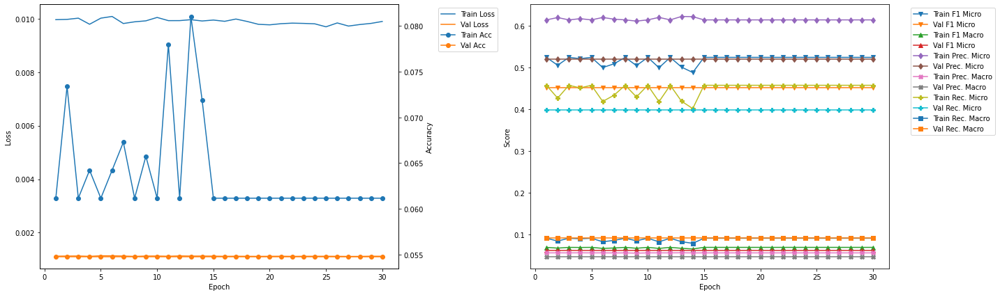

-------------------------------------------
FOLD 6
-------------------------------------------
Validation F1 Micro Score Increased (0.578588 --> 0.589342).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 32.12
Train Loss: 0.0102 	Validation Loss: 0.0009
Train Accuracy: 0.0657 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4846 	Validation F1 Micro: 0.5893
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0723
Train Precision Mirco: 0.5894 	Validation Precision Micro: 0.7015
Train Precision Marco: 0.0699 	Validation Precision Macro: 0.0629
Train Recall Mirco: 0.4115 	Validation Recall Micro: 0.5081
Train Recall Marco: 0.0843 	Validation Recall Macro: 0.0854

Validation F1 Micro Score Increased (0.589342 --> 0.598187).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.35
Train Loss: 0.0101 	Validation Loss: 0.0009
Train Accuracy: 0.0627 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4461 	Validation F1 Micro: 0.5982
Train F1 Marco: 0.0613 	Validation F1 Macro: 0.0

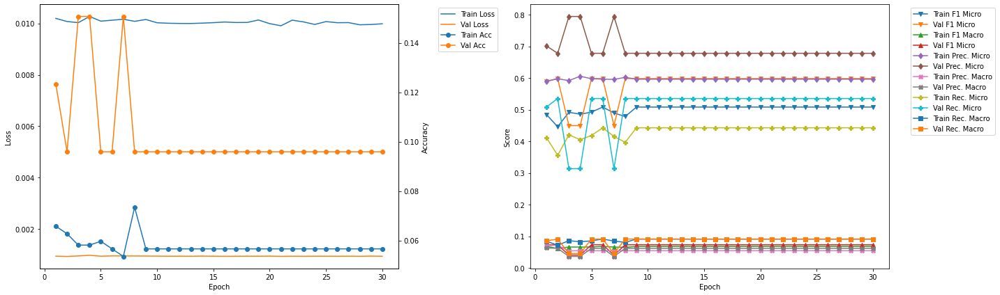

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.52
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4891 	Validation F1 Micro: 0.4886
Train F1 Marco: 0.067 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6123 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0647 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4072 	Validation Recall Micro: 0.4175
Train Recall Marco: 0.0803 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.73
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4847 	Validation F1 Micro: 0.4886
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6239 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3963 	V

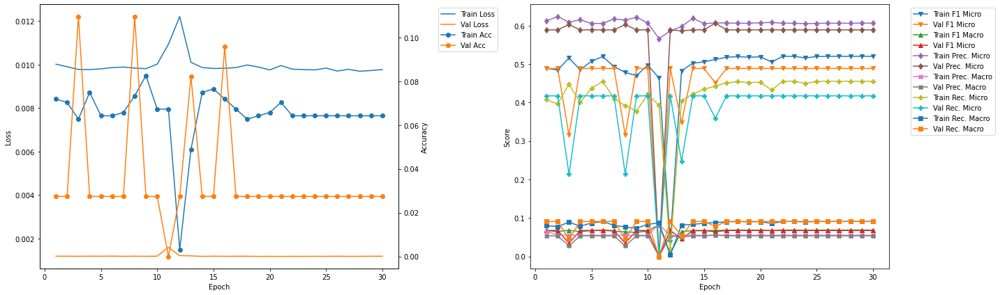

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.87
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.48 	Validation F1 Micro: 0.4548
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0611
Train Precision Mirco: 0.6146 	Validation Precision Micro: 0.5069
Train Precision Marco: 0.0697 	Validation Precision Macro: 0.0461
Train Recall Mirco: 0.3938 	Validation Recall Micro: 0.4124
Train Recall Marco: 0.0774 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.08
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0809 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5029 	Validation F1 Micro: 0.4548
Train F1 Marco: 0.0672 	Validation F1 Macro: 0.0611
Train Precision Mirco: 0.6296 	Validation Precision Micro: 0.5069
Train Precision Marco: 0.0566 	Validation Precision Macro: 0.0461
Train Recall Mirco: 0.4186 	

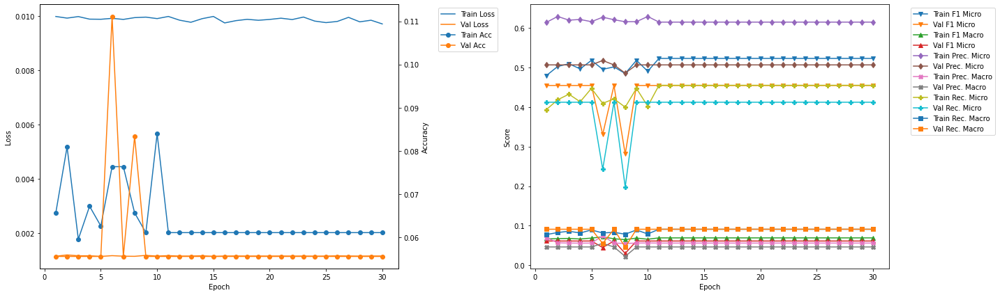

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 51.23
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4687 	Validation F1 Micro: 0.5648
Train F1 Marco: 0.0628 	Validation F1 Macro: 0.0736
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.6806
Train Precision Marco: 0.0535 	Validation Precision Macro: 0.0619
Train Recall Mirco: 0.3842 	Validation Recall Micro: 0.4828
Train Recall Marco: 0.0764 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.44
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5058 	Validation F1 Micro: 0.3782
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0381
Train Precision Mirco: 0.6016 	Validation Precision Micro: 0.7222
Train Precision Marco: 0.0772 	Validation Precision Macro: 0.0328
Train Recall Mirco: 0.4364

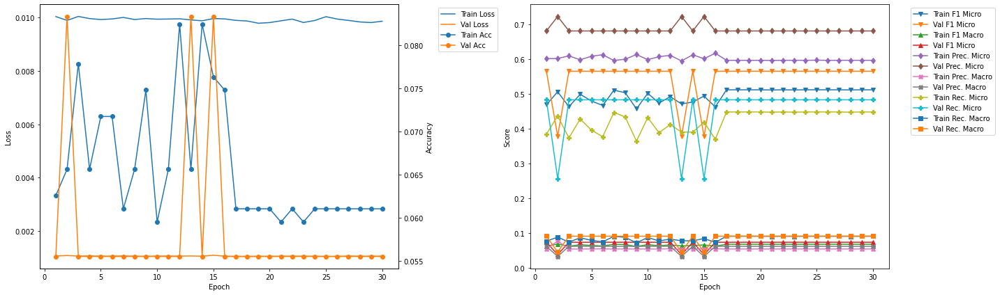

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 57.58
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4835 	Validation F1 Micro: 0.5231
Train F1 Marco: 0.069 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.6075 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0754 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4015 	Validation Recall Micro: 0.4696
Train Recall Marco: 0.0808 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 57.79
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5163 	Validation F1 Micro: 0.5231
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4496 

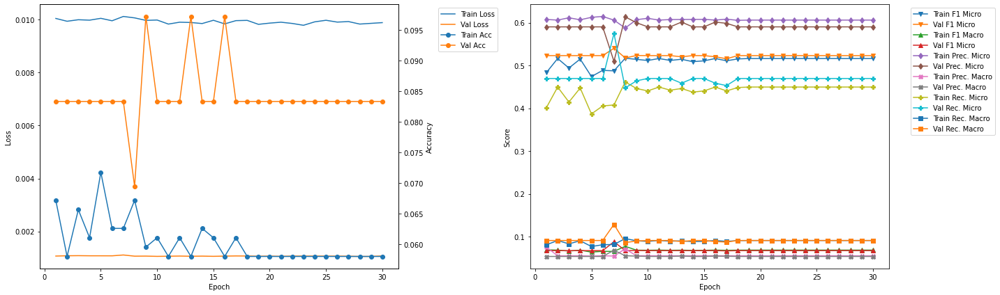

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 6 	Epoch: 2
Train Loss: 0.0101 	Validation Loss: 0.0009
Train Accuracy: 0.0627 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4461 	Validation F1 Micro: 0.5982
Train F1 Marco: 0.0613 	Validation F1 Macro: 0.0729
Train Precision Mirco: 0.5977 	Validation Precision Micro: 0.6781
Train Precision Marco: 0.0712 	Validation Precision Macro: 0.0616
Train Recall Mirco: 0.3558 	Validation Recall Micro: 0.5351
Train Recall Marco: 0.0716 	Validation Recall Macro: 0.0909


In [27]:
vgg16bnLSTM_500_1_0_best = Kfold_train_CNN_RNN(model = vgg16bnLSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_500_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.23
Train Loss: 0.017 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0604 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0471 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1347 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1285 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0389 	Validation Recall Micro: 0.0
Train Recall Marco: 0.045 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.45
Train Loss: 0.0124 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

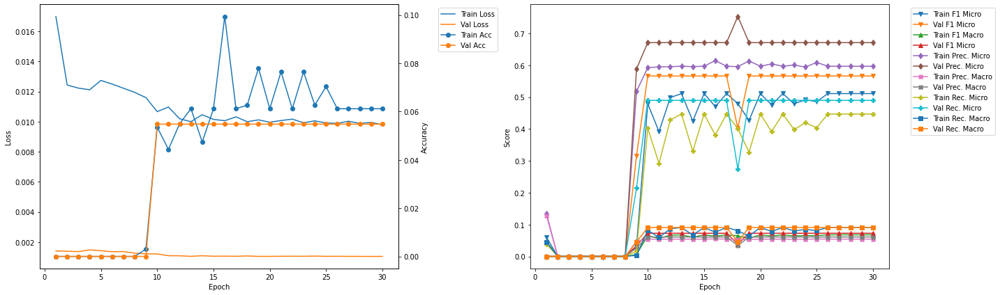

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 7.02
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4733 	Validation F1 Micro: 0.5588
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.389 	Validation Recall Micro: 0.4897
Train Recall Marco: 0.0782 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.24
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0948 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4773 	Validation F1 Micro: 0.5588
Train F1 Marco: 0.0647 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6218 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0558 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.3873 	V

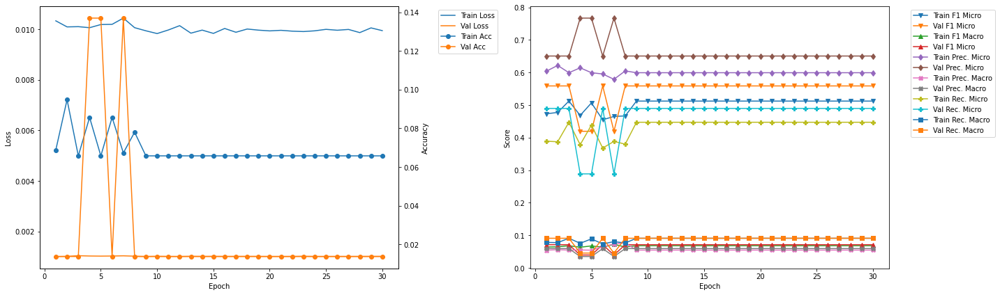

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 13.79
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.078 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4809 	Validation F1 Micro: 0.5116
Train F1 Marco: 0.0643 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6142 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3951 	Validation Recall Micro: 0.4444
Train Recall Marco: 0.078 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.02
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4951 	Validation F1 Micro: 0.5116
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.606 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.4185 	Val

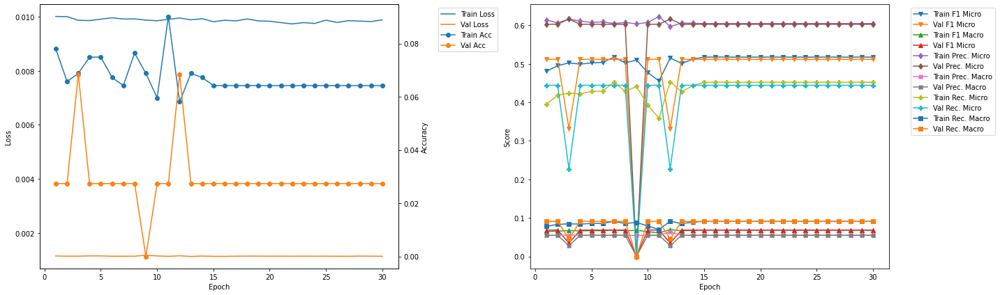

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 20.54
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5036 	Validation F1 Micro: 0.5045
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0661
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4318 	Validation Recall Micro: 0.4492
Train Recall Marco: 0.0865 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 20.77
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5183 	Validation F1 Micro: 0.5045
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0661
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4517

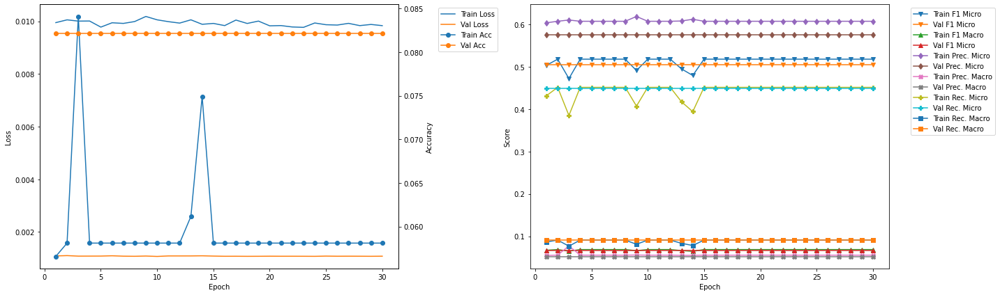

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 27.3
Train Loss: 0.0099 	Validation Loss: 0.0013
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5231 	Validation F1 Micro: 0.4658
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0666
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4595 	Validation Recall Micro: 0.3881
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 27.52
Train Loss: 0.0098 	Validation Loss: 0.0013
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5231 	Validation F1 Micro: 0.4658
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0666
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4595 

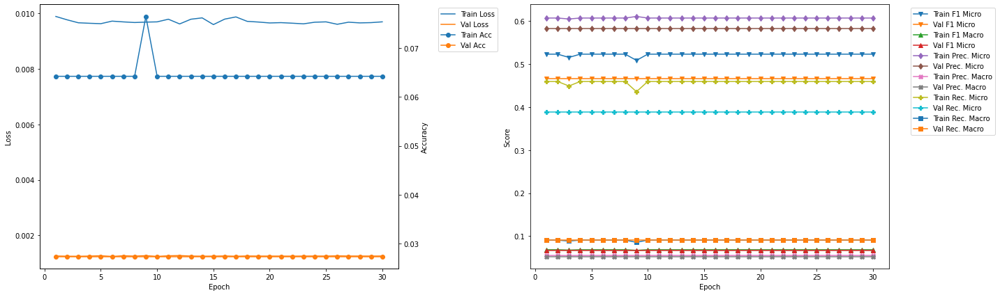

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.08
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4804 	Validation F1 Micro: 0.5501
Train F1 Marco: 0.0646 	Validation F1 Macro: 0.0719
Train Precision Mirco: 0.6099 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.3962 	Validation Recall Micro: 0.4729
Train Recall Marco: 0.079 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.31
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5131 	Validation F1 Micro: 0.5501
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0719
Train Precision Mirco: 0.5986 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.449 	Va

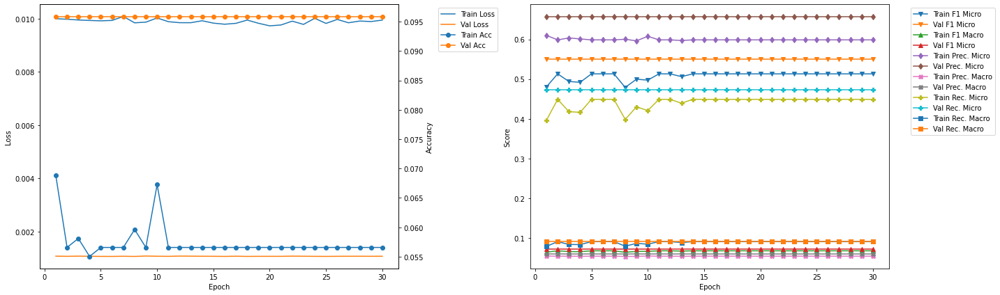

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 40.83
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5222 	Validation F1 Micro: 0.4654
Train F1 Marco: 0.0691 	Validation F1 Macro: 0.0611
Train Precision Mirco: 0.6154 	Validation Precision Micro: 0.5068
Train Precision Marco: 0.0559 	Validation Precision Macro: 0.0461
Train Recall Mirco: 0.4535 	Validation Recall Micro: 0.4302
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 41.06
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5222 	Validation F1 Micro: 0.4654
Train F1 Marco: 0.0691 	Validation F1 Macro: 0.0611
Train Precision Mirco: 0.6154 	Validation Precision Micro: 0.5068
Train Precision Marco: 0.0559 	Validation Precision Macro: 0.0461
Train Recall Mirco: 0.4535

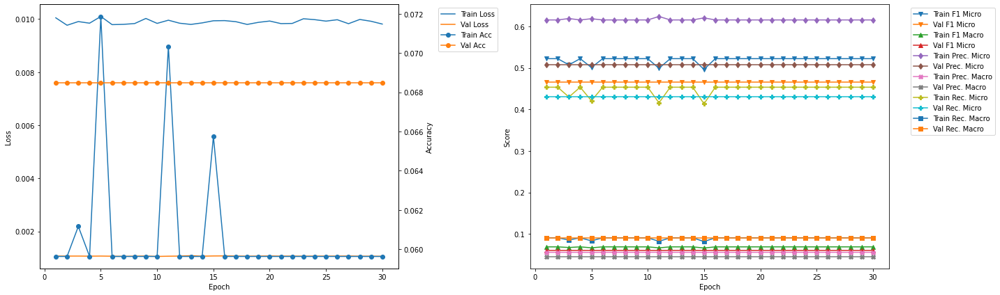

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 47.57
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4936 	Validation F1 Micro: 0.4953
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0644
Train Precision Mirco: 0.6083 	Validation Precision Micro: 0.5486
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0499
Train Recall Mirco: 0.4153 	Validation Recall Micro: 0.4514
Train Recall Marco: 0.0827 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 47.8
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.5028 	Validation F1 Micro: 0.332
Train F1 Marco: 0.067 	Validation F1 Macro: 0.033
Train Precision Mirco: 0.6121 	Validation Precision Micro: 0.5694
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0259
Train Recall Mirco: 0.4266 	Vali

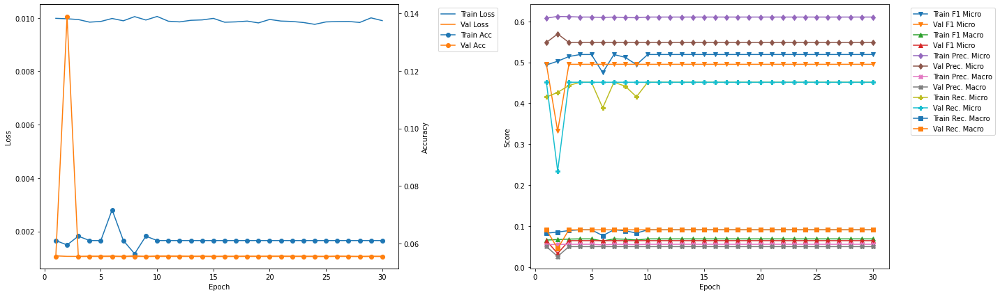

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.32
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4786 	Validation F1 Micro: 0.5187
Train F1 Marco: 0.0639 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.3951 	Validation Recall Micro: 0.4433
Train Recall Marco: 0.078 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.54
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5067 	Validation F1 Micro: 0.5187
Train F1 Marco: 0.0672 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4364 	V

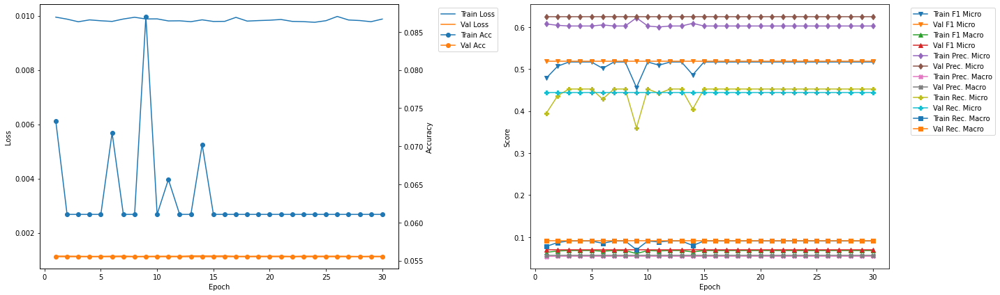

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 61.08
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0534 	Validation Accuracy: 0.125
Train F1 Mirco: 0.5155 	Validation F1 Micro: 0.5294
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4506 	Validation Recall Micro: 0.4592
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 61.31
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4931 	Validation F1 Micro: 0.5294
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6033 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4169 	

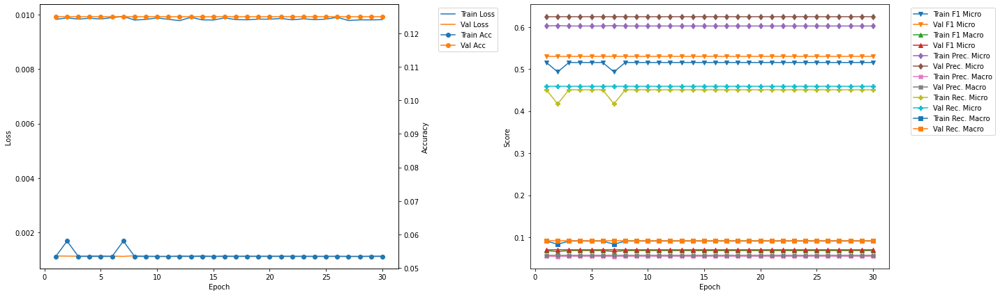

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 1 	Epoch: 10
Train Loss: 0.0107 	Validation Loss: 0.0012
Train Accuracy: 0.0535 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4794 	Validation F1 Micro: 0.5665
Train F1 Marco: 0.0649 	Validation F1 Macro: 0.0728
Train Precision Mirco: 0.5927 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.061
Train Recall Mirco: 0.4024 	Validation Recall Micro: 0.49
Train Recall Marco: 0.0822 	Validation Recall Macro: 0.0909


In [28]:
vgg19bnLSTM_500_1_0_best = Kfold_train_CNN_RNN(model = vgg19bnLSTM_500_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_500_1_0')

In [29]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 8:46:47
